**EDA for InsaidTelecom**

**Importing required libraries**

In [0]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

In [0]:
!pip install mysql-connector-python
import mysql.connector
from mysql.connector import Error

In [0]:
!pip install folium
import folium
from folium import plugins
from folium.plugins import HeatMap

In [0]:
!pip install googletrans

import googletrans
from googletrans import Translator

In [0]:
!pip install pygeocoder
from pygeocoder import Geocoder

**Generic function to get data from Database**

In [0]:
def get_data(sqlst):
    df=pd.DataFrame()
    try:
        connection = mysql.connector.connect(host='cpanel.insaid.co', database='Capstone1',user='student',password='student')
        if connection.is_connected():
            db_Info = connection.get_server_info()
            print("Connected to MySQL Server version", db_Info)
            df=pd.read_sql(sqlst, connection)
            return df
    except Error as e:
            print("Error while connecting to MySQL", e)
            return None
    finally:
        if (connection.is_connected()):
            print("MySQL connection is closed")

**Analysis of data from events_data dataset**

**Analysis on events_data - Madhya Pradesh**

In [0]:
df_events_mp=pd.DataFrame()
sqlmp="select event_id, CAST(device_id as CHAR) device_id, timestamp, longitude, latitude, city, state from events_data where state in  ('MadhyaPradesh')"

In [0]:
df_events_mp=get_data(sqlmp)
df_events_mp.head()

Connected to MySQL Server version 5.6.46-cll-lve
MySQL connection is closed


,event_id,device_id,timestamp,longitude,latitude,city,state
0,10117,-5323073305882503557,2016-05-01 11:11:24,75.939545,22.769171,Indore,MadhyaPradesh
1,112369,-5323073305882503557,2016-05-04 22:47:19,75.939545,22.769171,Indore,MadhyaPradesh
2,139098,-5323073305882503557,2016-05-01 09:55:58,75.939545,22.769171,Indore,MadhyaPradesh
3,190983,-5323073305882503557,2016-05-04 22:51:03,75.939545,22.769171,Indore,MadhyaPradesh
4,249507,-5323073305882503557,2016-05-01 11:24:12,75.939545,22.769171,Indore,MadhyaPradesh


In [0]:
df_events_mp.shape

(232690, 7)

In [0]:
df_events_mp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232690 entries, 0 to 232689
Data columns (total 7 columns):
event_id     232690 non-null int64
device_id    232639 non-null object
timestamp    232690 non-null datetime64[ns]
longitude    232627 non-null float64
latitude     232627 non-null float64
city         232690 non-null object
state        232690 non-null object
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 12.4+ MB


In [0]:
df_events_mp.isnull().sum()

event_id      0
device_id    51
timestamp     0
longitude    63
latitude     63
city          0
state         0
dtype: int64

The Madhya Pradesh dataset has following NULL values which need to be taken care -

device_id - 51

longitude - 63

latitude - 63

In [0]:
len(df_events_mp.device_id.unique())

3221

In [0]:
len(df_events_mp.device_id)

232690

Out of 232690 device_id records, we have 3221 unique device_id values

In [0]:
df_events_mp[df_events_mp.device_id.isnull()].groupby(['longitude','latitude']).count()

,,event_id,device_id,timestamp,city,state
longitude,latitude,,,,,
75.882957,22.814520,17,0,17,17,17
75.923332,22.777781,17,0,17,17,17
75.958054,22.817526,17,0,17,17,17


In [0]:
df_events_mp[df_events_mp.device_id.isna()].head()

,event_id,device_id,timestamp,longitude,latitude,city,state
48308,84091,None,2016-05-02 13:28:09,75.882957,22.81452,Indore,MadhyaPradesh
48311,93602,None,2016-05-03 11:57:22,75.882957,22.81452,Indore,MadhyaPradesh
48379,356056,None,2016-05-02 13:48:16,75.882957,22.81452,Indore,MadhyaPradesh
48427,558444,None,2016-05-02 18:58:23,75.882957,22.81452,Indore,MadhyaPradesh
48490,850678,None,2016-05-07 15:40:10,75.882957,22.81452,Indore,MadhyaPradesh


From above we can observe for 3 latitude and longitude values we have missing device_id values - 17 each.

So, we need to check the device_id values in the dataset present for above longitude/latitude values

In [0]:
df_events_mp[(df_events_mp.longitude==75.882957) & (df_events_mp.latitude==22.814520)]['device_id'].unique()

array(['3132861355949762783', None], dtype=object)

In [0]:
df_events_mp[(df_events_mp.longitude==75.923332) & (df_events_mp.latitude==22.777781)]['device_id'].unique()

array(['7597735768595924821', None], dtype=object)

In [0]:
df_events_mp[(df_events_mp.longitude==75.958054) & (df_events_mp.latitude==22.817526)]['device_id'].unique()

array(['-2399250255599832969', None], dtype=object)

From the above values, we can observe that for each set of latitude and longitude we have single device_id values, so can use those device_id values to fill empty values.

In [0]:
df_events_mp.loc[(df_events_mp.longitude==75.882957) & (df_events_mp.latitude==22.814520) & (df_events_mp.device_id.isnull()),'device_id']=df_events_mp[(df_events_mp.longitude==75.882957) & (df_events_mp.latitude==22.814520)]['device_id'].unique()[0]

In [0]:
df_events_mp.loc[(df_events_mp.longitude==75.923332) & (df_events_mp.latitude==22.777781) & (df_events_mp.device_id.isnull()),'device_id']=df_events_mp[(df_events_mp.longitude==75.923332) & (df_events_mp.latitude==22.777781)]['device_id'].unique()[0]

In [0]:
df_events_mp.loc[(df_events_mp.longitude==75.958054) & (df_events_mp.latitude==22.817526) & (df_events_mp.device_id.isnull()),'device_id']=df_events_mp[(df_events_mp.longitude==75.958054) & (df_events_mp.latitude==22.817526)]['device_id'].unique()[0]

In [0]:
df_events_mp[df_events_mp.device_id.isnull()].groupby(['longitude','latitude']).count()

,,event_id,device_id,timestamp,city,state
longitude,latitude,,,,,


Now all NULL device_id values are populated with appropriate values

Now, process for NULL longitude and latitude values

In [0]:
df_events_mp[df_events_mp.latitude.isnull()].groupby(['device_id']).count()

,event_id,timestamp,longitude,latitude,city,state
device_id,,,,,,
-8790560034584248901,21,21,0,0,21,21
2350979402202438478,21,21,0,0,21,21
3738280493453802895,21,21,0,0,21,21


In [0]:
df_events_mp[df_events_mp.longitude.isnull()].groupby(['device_id']).count()

,event_id,timestamp,longitude,latitude,city,state
device_id,,,,,,
-8790560034584248901,21,21,0,0,21,21
2350979402202438478,21,21,0,0,21,21
3738280493453802895,21,21,0,0,21,21


Same device_id values have missing longitude and latitude

In [0]:
device_list1=df_events_mp.loc[df_events_mp.latitude.isnull(), 'device_id'].unique().tolist()
device_list1

['2350979402202438478', '-8790560034584248901', '3738280493453802895']

In [0]:
device_list2=df_events_mp.loc[df_events_mp.longitude.isnull(), 'device_id'].unique().tolist()
device_list2

['2350979402202438478', '-8790560034584248901', '3738280493453802895']

In [0]:
device_id_vals=set(device_list1+device_list2)
device_id_vals

{'-8790560034584248901', '2350979402202438478', '3738280493453802895'}

In [0]:
for val in device_id_vals:
    print("device_id =",val)
    print(df_events_mp[df_events_mp.device_id==val]['longitude'].unique())
    print(df_events_mp[df_events_mp.device_id==val]['latitude'].unique())
    print("\n")

device_id = 2350979402202438478
[75.888474       nan]
[22.745064       nan]


device_id = 3738280493453802895
[75.937988       nan]
[22.762011       nan]


device_id = -8790560034584248901
[75.933777       nan]
[22.761965       nan]




So, for each of the device_id we have unique values, so we can use these values to populate NULL values

In [0]:
for val in device_id_vals:
    df_events_mp.loc[(df_events_mp.device_id==val) & (df_events_mp.latitude.isnull()), 'longitude'] \
        = df_events_mp[(df_events_mp.device_id==val)]['longitude'].unique()[0]
    df_events_mp.loc[(df_events_mp.device_id==val) & (df_events_mp.latitude.isnull()), 'latitude'] \
        = df_events_mp[(df_events_mp.device_id==val)]['latitude'].unique()[0]

In [0]:
df_events_mp[df_events_mp.longitude.isnull()].groupby(['device_id']).count()

,event_id,timestamp,longitude,latitude,city,state
device_id,,,,,,


All NULL values in longitude and latitude are populated

In [0]:
df_events_mp.describe()

,event_id,longitude,latitude
count,2.326900e+05,232690.000000,232690.000000
mean,1.625065e+06,76.322366,22.962431
std,9.410485e+05,1.191706,0.692545
min,1.011700e+04,12.567400,21.344784
25%,8.116035e+05,75.898392,22.751848
50%,1.623738e+06,75.923714,22.781586
75%,2.438496e+06,75.950455,22.808426
max,3.252939e+06,82.367500,41.871899


Describe information not much use as we have discrete data in the required columns.

Splitting Date and time from timestamp

In [0]:
df_events_mp['Date']=df_events_mp.timestamp.dt.date
df_events_mp['Time']=df_events_mp.timestamp.dt.time
#df_events_mp.drop('timestamp', axis=1, inplace=True)
df_events_mp.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
0,10117,-5323073305882503557,2016-05-01 11:11:24,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,11:11:24
1,112369,-5323073305882503557,2016-05-04 22:47:19,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-04,22:47:19
2,139098,-5323073305882503557,2016-05-01 09:55:58,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,09:55:58
3,190983,-5323073305882503557,2016-05-04 22:51:03,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-04,22:51:03
4,249507,-5323073305882503557,2016-05-01 11:24:12,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,11:24:12


In [0]:
state_mp_list=list(df_events_mp.city.unique())
state_mp_list

['Indore',
 'Raghogarh',
 'Sheopur',
 'Sidhi',
 'Sarni',
 'Betul',
 'Sehore',
 'Datia',
 'Dabra',
 'Guna',
 'Rewa',
 'Ratlam',
 'Bhind',
 'Itarsi',
 'Dhar',
 'Dewas',
 'Nagda',
 'Mandidip',
 'Damoh',
 'Murwara',
 'JabalpurCantonment',
 'Gwalior',
 'Tikamgarh',
 'Chhindwara',
 'Hoshangabad',
 'Shahdol',
 'Harda',
 'Jabalpur',
 'Shivapuri',
 'Nimach',
 'Shajapur',
 'Bhopal',
 'Sagar',
 'Morena',
 'Chhatarpur',
 'Ashoknagar',
 'Seoni',
 'Singrauli',
 'Balaghat',
 'Vidisha',
 'Jaora',
 'Mandsaur',
 'Khandwa',
 'Satna',
 'Burhanpur',
 'Basoda',
 'Khargone',
 'Sendhwa',
 'Gohad',
 'Ujjain',
 'Mau',
 'BinaEtawa']

**Event logged city wise**

In [0]:
mp_top10_city_event=df_events_mp.groupby('city')['event_id'].count().nlargest(100)
mp_top10_city_event=mp_top10_city_event.reset_index()
mp_top10_city_event

,city,event_id
0,Indore,189753
1,Shahdol,1778
2,Chhindwara,1658
3,Damoh,1505
4,Betul,1301
5,Tikamgarh,1268
6,Ashoknagar,1145
7,Raghogarh,1140
8,Shajapur,1132
9,Bhopal,1083


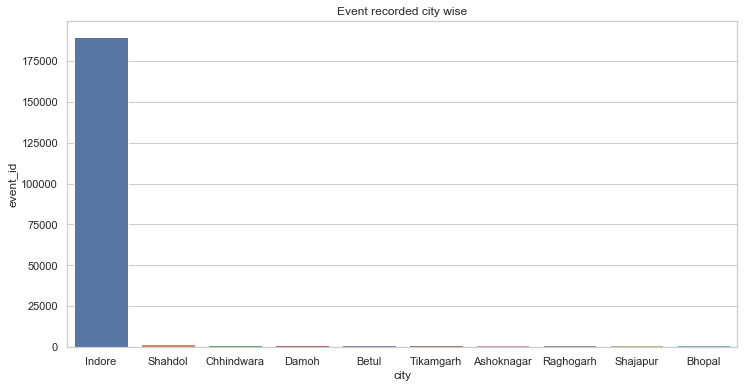

In [0]:
fig=plt.figure(figsize=(12,6))
sns.set(style="whitegrid")
sns.barplot(x='city',y='event_id',data=mp_top10_city_event[0:10])
plt.title('Event recorded city wise')
plt.show()

From the above graph, we can observe that Indore has registered maximum events registered and other cities have very less count of events registered as compared to Indore, so we can assume in Madhya Pradesh, Indore has maximum users registered with mobile devices and surprisingly more than captital city of Bhopal.

**Event logged date-wise**

In [0]:
mp_top5_date_event=df_events_mp.groupby('Date')['event_id'].count().nlargest(5)
mp_top5_date_event=mp_top5_date_event.reset_index()
mp_top5_date_event

,Date,event_id
0,2016-05-03,36099
1,2016-05-04,34425
2,2016-05-06,33919
3,2016-05-05,33132
4,2016-05-07,32548


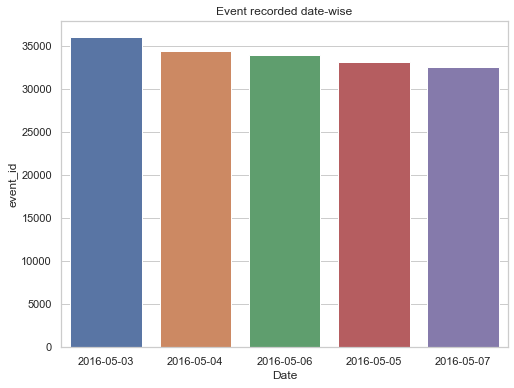

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Date',y='event_id',data=mp_top5_date_event)
plt.title('Event recorded date-wise')
plt.show()

03 May 2016 has maximum events registered followed by 04 May and 06 May

03,04,06 and 05 May are weekdays while 07 May is weekend, so Weekdays have more events registered as compared to weekends

**Event logged time-wise**

In [0]:
mp_top5_time_event=df_events_mp.groupby('Time')['event_id'].count().nlargest(5)
mp_top5_time_event=mp_top5_time_event.reset_index()
mp_top5_time_event

,Time,event_id
0,20:05:31,16
1,10:00:34,14
2,20:00:25,14
3,08:18:38,13
4,11:00:28,13


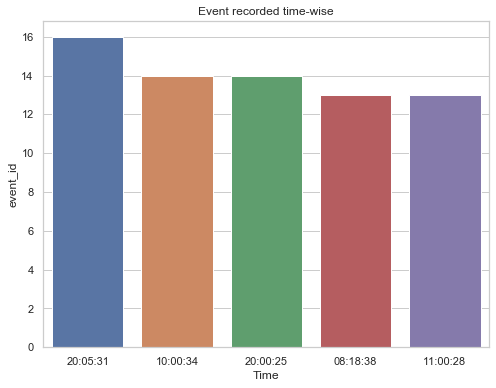

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Time',y='event_id',data=mp_top5_time_event)
plt.title('Event recorded time-wise')
plt.show()

In the night, around 8 PM, has registered maximum events followed by 10 AM and 11 AM.

**Event logged device wise**

In [0]:
mp_top5_device_event=df_events_mp.groupby('device_id')['event_id'].count().nlargest(5)
mp_top5_device_event=mp_top5_device_event.reset_index()
mp_top5_device_event

,device_id,event_id
0,3751556080923780612,1507
1,4113023436861671597,1157
2,-1752057305775059707,1084
3,-8790560034584248901,810
4,3738280493453802895,797


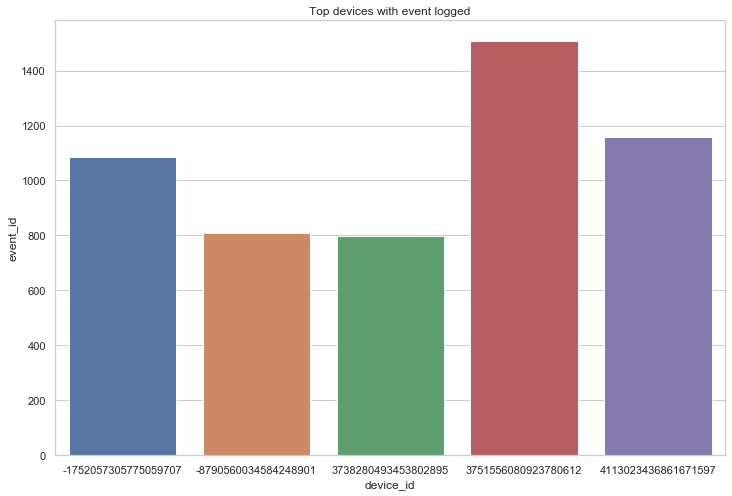

In [0]:
fig=plt.figure(figsize=(12,8))
sns.set(style="whitegrid")
sns.barplot(x='device_id',y='event_id',data=mp_top5_device_event)
plt.title('Top devices with event logged')
plt.show()

The above users with highest event registered could be most profitable customers for the company as they have used their mobile devices quite regularly 

In [0]:
df_events_mp.groupby(['latitude','longitude'])['event_id'].count()
mp_top10_event_loc=df_events_mp.groupby(['latitude','longitude'])['event_id'].count().nlargest(500)
mp_top10_event_loc=mp_top10_event_loc.reset_index()
mp_top10_event_loc

,latitude,longitude,event_id
0,22.809816,75.895462,1507
1,22.732515,75.906532,1157
2,22.818846,75.930969,1084
3,22.761965,75.933777,810
4,22.762011,75.937988,797
...,...,...,...
495,23.211931,79.979973,143
496,26.666592,78.859856,143
497,22.756691,75.877068,142
498,22.766001,75.940834,142


In [0]:
location=mp_top10_event_loc[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], tiles='OpenStreetMap')
for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point]).add_to(base_map)
base_map

Indore and Betul has maximum events registered

In [0]:
location=df_events_mp[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], control_scale=True, zoom_start=12, tiles='OpenStreetMap')
HeatMap(location, min_opacity=0, overlay=False, blur=20).add_to(base_map)
base_map

- Total records - 232690

-  Data is for duration 2016, 30 April to 7 May , where May 3 and May 4 have recorded maximum events registered
-  8 PM, 10 AM and 11 AM have maximum events registered

- Data for 52 cities in Madhya Pradesh, and 189702 records belong to Indore city

- Unique device_id values - 3221

**Analysis on events_data - Chattisgarh**

In [0]:
df_events_cht=pd.DataFrame()
sqlcht="select event_id, CAST(device_id as CHAR) device_id, timestamp, longitude, latitude, city, state from events_data where state in  ('Chhattisgarh')"

In [0]:
df_events_cht=get_data(sqlcht)
df_events_cht.head()

Connected to MySQL Server version 5.6.46-cll-lve
MySQL connection is closed


,event_id,device_id,timestamp,longitude,latitude,city,state
0,21994,3170675365100452735,2016-05-04 19:44:31,81.647987,21.284864,Raipur,Chhattisgarh
1,60725,3170675365100452735,2016-05-02 22:02:20,81.647987,21.284864,Raipur,Chhattisgarh
2,64448,3170675365100452735,2016-05-05 01:08:34,81.647987,21.284864,Raipur,Chhattisgarh
3,65830,3170675365100452735,2016-05-04 00:50:31,81.647987,21.284864,Raipur,Chhattisgarh
4,70306,3170675365100452735,2016-05-07 00:33:50,81.647987,21.284864,Raipur,Chhattisgarh


In [0]:
df_events_cht.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9754 entries, 0 to 9753
Data columns (total 7 columns):
event_id     9754 non-null int64
device_id    9754 non-null object
timestamp    9754 non-null datetime64[ns]
longitude    9754 non-null float64
latitude     9754 non-null float64
city         9754 non-null object
state        9754 non-null object
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 533.5+ KB


In [0]:
df_events_cht.isnull().sum()

event_id     0
device_id    0
timestamp    0
longitude    0
latitude     0
city         0
state        0
dtype: int64

No NULL values

In [0]:
df_events_cht.shape

(9754, 7)

In [0]:
len(df_events_cht.device_id.unique())

400

**Splitting timestamp to Date and Time**

In [0]:
df_events_cht['Date']=df_events_cht.timestamp.dt.date
df_events_cht['Time']=df_events_cht.timestamp.dt.time
#df_events_cht.drop('timestamp', axis=1, inplace=True)
df_events_cht.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
0,21994,3170675365100452735,2016-05-04 19:44:31,81.647987,21.284864,Raipur,Chhattisgarh,2016-05-04,19:44:31
1,60725,3170675365100452735,2016-05-02 22:02:20,81.647987,21.284864,Raipur,Chhattisgarh,2016-05-02,22:02:20
2,64448,3170675365100452735,2016-05-05 01:08:34,81.647987,21.284864,Raipur,Chhattisgarh,2016-05-05,01:08:34
3,65830,3170675365100452735,2016-05-04 00:50:31,81.647987,21.284864,Raipur,Chhattisgarh,2016-05-04,00:50:31
4,70306,3170675365100452735,2016-05-07 00:33:50,81.647987,21.284864,Raipur,Chhattisgarh,2016-05-07,00:33:50


In [0]:
state_cht_list=list(df_events_cht.city.unique())
state_cht_list

['Raipur',
 'Korba',
 'Raigarh',
 'Jagdalpur',
 'Bilaspur',
 'Bhilai',
 'Chirmiri',
 'Rajnandgaon',
 'Charoda',
 'Durg',
 'Ambikapur',
 'Dhamtari']

**Event logged city-wise**

In [0]:
cht_top10_city_event=df_events_cht.groupby('city')['event_id'].count().nlargest(10)
cht_top10_city_event=cht_top10_city_event.reset_index()
cht_top10_city_event

,city,event_id
0,Jagdalpur,1382
1,Bilaspur,1145
2,Rajnandgaon,1034
3,Bhilai,911
4,Durg,873
5,Korba,858
6,Chirmiri,816
7,Raipur,648
8,Charoda,645
9,Raigarh,577


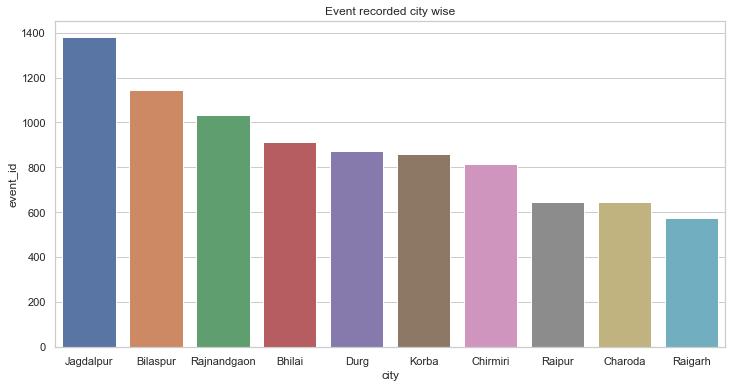

In [0]:
fig=plt.figure(figsize=(12,6))
sns.set(style="whitegrid")
sns.barplot(x='city',y='event_id',data=cht_top10_city_event)
plt.title('Event recorded city wise')
plt.show()

Jabalpur has highest events registered followed by Bilaspur and Rajnandgaon

Here also, capital city Raipur is not in top 5 events registerd 

**Event logged date wise**

In [0]:
cht_top5_date_event=df_events_cht.groupby('Date')['event_id'].count().nlargest(5)
cht_top5_date_event=cht_top5_date_event.reset_index()
cht_top5_date_event

,Date,event_id
0,2016-05-05,1560
1,2016-05-06,1518
2,2016-05-02,1417
3,2016-05-04,1368
4,2016-05-03,1336


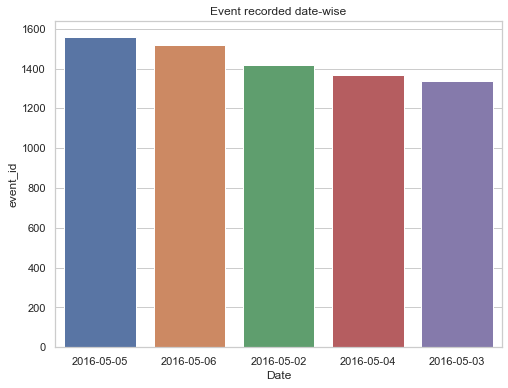

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Date',y='event_id',data=cht_top5_date_event)
plt.title('Event recorded date-wise')
plt.show()

05 May and 06 May have highest events registered, all days with highest events are weekdays

**Event logged time wise**

In [0]:
cht_top5_time_event=df_events_cht.groupby('Time')['event_id'].count().nlargest(5)
cht_top5_time_event=cht_top5_time_event.reset_index()
cht_top5_time_event

,Time,event_id
0,03:43:52,5
1,03:45:22,5
2,03:44:52,4
3,19:23:38,4
4,20:07:36,4


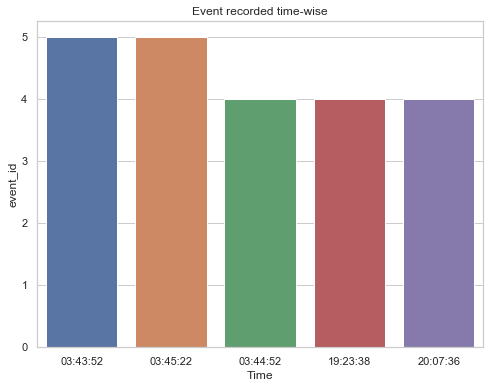

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Time',y='event_id',data=cht_top5_time_event)
plt.title('Event recorded time-wise')
plt.show()

Around 3 AM have  highest events registered, that is late in the night as compared to normal day timings

**Event logged for device wise**

In [0]:
cht_top5_device_event=df_events_cht.groupby('device_id')['event_id'].count().nlargest(5)
cht_top5_device_event=cht_top5_device_event.reset_index()
cht_top5_device_event

,device_id,event_id
0,130313677513796529,254
1,4072631279337923535,222
2,3170675365100452735,207
3,7437999276137431725,189
4,2676119753740865787,183


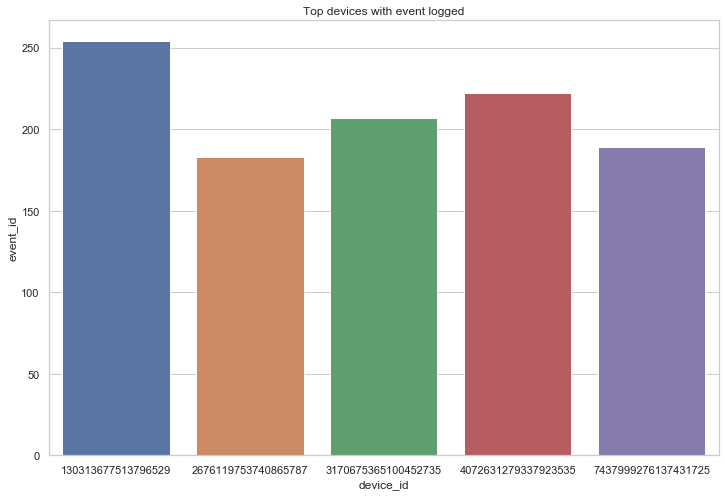

In [0]:
fig=plt.figure(figsize=(12,8))
sns.set(style="whitegrid")
sns.barplot(x='device_id',y='event_id',data=cht_top5_device_event)
plt.title('Top devices with event logged')
plt.show()

In [0]:
df_events_cht.groupby(['latitude','longitude'])['event_id'].count()
cht_top10_event_loc=df_events_cht.groupby(['latitude','longitude'])['event_id'].count().nlargest(100)
cht_top10_event_loc=cht_top10_event_loc.reset_index()
cht_top10_event_loc

,latitude,longitude,event_id
0,21.247288,81.470337,254
1,19.167482,82.114960,222
2,21.284864,81.647987,207
3,21.298891,81.333244,189
4,19.105057,82.054611,183
...,...,...,...
95,21.114578,81.113197,30
96,21.127501,81.125595,30
97,21.246189,81.449303,30
98,23.156279,83.241531,30


In [0]:
location=cht_top10_event_loc[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], tiles='OpenStreetMap')
for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point]).add_to(base_map)
base_map

Rajnandgaon location has highest count of events registerd

In [0]:
location=df_events_cht[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], control_scale=True, zoom_start=13, max_zoom=30, tiles='OpenStreetMap')
HeatMap(location, min_opacity=0, overlay=False, blur=20).add_to(base_map)
base_map

- 9754 records and 400 unique device_id
- Jagdalpur has highest count of records
- May 5 and May 6 have highest events recorded
- 3 AM has highest count of events registered

**Analysis on events_data - Uttrakhand**

In [0]:
df_events_utr=pd.DataFrame()
sqlutr="select event_id, CAST(device_id as CHAR) device_id, timestamp, longitude, latitude, city, state from events_data where state in  ('Uttaranchal')"

In [0]:
df_events_utr=get_data(sqlutr)
df_events_utr.head()

Connected to MySQL Server version 5.6.46-cll-lve
MySQL connection is closed


,event_id,device_id,timestamp,longitude,latitude,city,state
0,21134,3256357565700008048,2016-05-07 18:39:49,80.266388,29.64415,Pithoragarh,Uttaranchal
1,66274,3256357565700008048,2016-05-07 00:14:05,80.266388,29.64415,Pithoragarh,Uttaranchal
2,89957,3256357565700008048,2016-05-02 10:35:29,80.266388,29.64415,Pithoragarh,Uttaranchal
3,104129,3256357565700008048,2016-05-06 15:38:15,80.266388,29.64415,Pithoragarh,Uttaranchal
4,165628,3256357565700008048,2016-05-06 06:17:42,80.266388,29.64415,Pithoragarh,Uttaranchal


In [0]:
df_events_utr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7720 entries, 0 to 7719
Data columns (total 7 columns):
event_id     7720 non-null int64
device_id    7720 non-null object
timestamp    7720 non-null datetime64[ns]
longitude    7720 non-null float64
latitude     7720 non-null float64
city         7720 non-null object
state        7720 non-null object
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 422.3+ KB


In [0]:
df_events_utr.isnull().sum()

event_id     0
device_id    0
timestamp    0
longitude    0
latitude     0
city         0
state        0
dtype: int64

In [0]:
len(df_events_utr.device_id.unique())

258

In [0]:
len(df_events_utr.city.unique())

8

**Splitting timestamp to Date and Time**

In [0]:
df_events_utr['Date']=df_events_utr.timestamp.dt.date
df_events_utr['Time']=df_events_utr.timestamp.dt.time
#df_events_utr.drop('timestamp', axis=1, inplace=True)
df_events_utr.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
0,21134,3256357565700008048,2016-05-07 18:39:49,80.266388,29.64415,Pithoragarh,Uttaranchal,2016-05-07,18:39:49
1,66274,3256357565700008048,2016-05-07 00:14:05,80.266388,29.64415,Pithoragarh,Uttaranchal,2016-05-07,00:14:05
2,89957,3256357565700008048,2016-05-02 10:35:29,80.266388,29.64415,Pithoragarh,Uttaranchal,2016-05-02,10:35:29
3,104129,3256357565700008048,2016-05-06 15:38:15,80.266388,29.64415,Pithoragarh,Uttaranchal,2016-05-06,15:38:15
4,165628,3256357565700008048,2016-05-06 06:17:42,80.266388,29.64415,Pithoragarh,Uttaranchal,2016-05-06,06:17:42


In [0]:
state_utr_list=list(df_events_utr.city.unique())
state_utr_list

['Pithoragarh',
 'Kashipur',
 'DehraDun',
 'Rurki',
 'DehraDunCantonment',
 'Haldwani',
 'Rishikesh',
 'Haridwar']

**Event logged city wise**

In [0]:
utr_top10_city_event=df_events_utr.groupby('city')['event_id'].count().nlargest(10)
utr_top10_city_event=utr_top10_city_event.reset_index()
utr_top10_city_event

,city,event_id
0,Kashipur,1711
1,Rurki,1274
2,Haldwani,1135
3,DehraDun,1053
4,DehraDunCantonment,923
5,Pithoragarh,697
6,Rishikesh,500
7,Haridwar,427


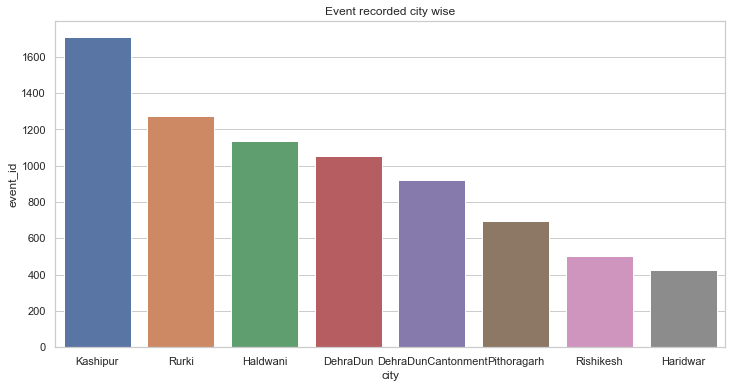

In [0]:
fig=plt.figure(figsize=(12,6))
sns.set(style="whitegrid")
sns.barplot(x='city',y='event_id',data=utr_top10_city_event)
plt.title('Event recorded city wise')
plt.show()

Kashipur has highest events registered followed by Rurki

Capital Dehradun is in top 5 cities with highest events registered

**Event logged date wise**

In [0]:
utr_top5_date_event=df_events_utr.groupby('Date')['event_id'].count().nlargest(5)
utr_top5_date_event=utr_top5_date_event.reset_index()
utr_top5_date_event

,Date,event_id
0,2016-05-01,1303
1,2016-05-03,1222
2,2016-05-06,1143
3,2016-05-02,1084
4,2016-05-05,1081


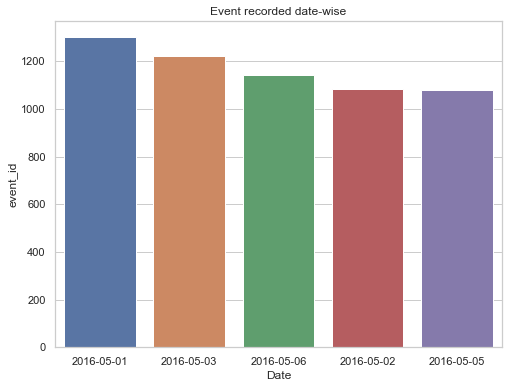

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Date',y='event_id',data=utr_top5_date_event)
plt.title('Event recorded date-wise')
plt.show()

01 May has highest events registered followed by 03 May

**Event logged time wise**

In [0]:
utr_top5_time_event=df_events_utr.groupby('Time')['event_id'].count().nlargest(5)
utr_top5_time_event=utr_top5_time_event.reset_index()
utr_top5_time_event

,Time,event_id
0,06:44:57,6
1,08:54:10,6
2,08:54:40,5
3,05:19:11,4
4,08:55:40,4


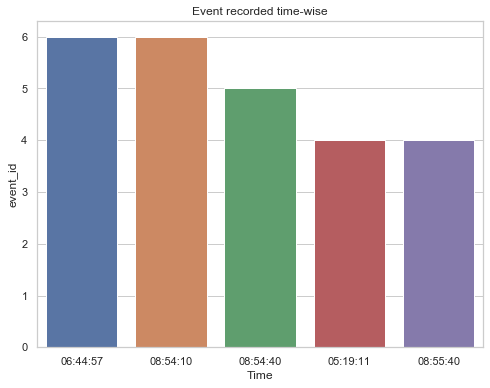

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Time',y='event_id',data=utr_top5_time_event)
plt.title('Event recorded time-wise')
plt.show()

Morning hours have highest count of events registered

**Event logged for devices**

In [0]:
utr_top5_device_event=df_events_utr.groupby('device_id')['event_id'].count().nlargest(5)
utr_top5_device_event=utr_top5_device_event.reset_index()
utr_top5_device_event

,device_id,event_id
0,-41983044236764349,379
1,-5549211741297649718,226
2,-9110145231826192389,185
3,4850278293934252512,166
4,-2789140251647324465,158


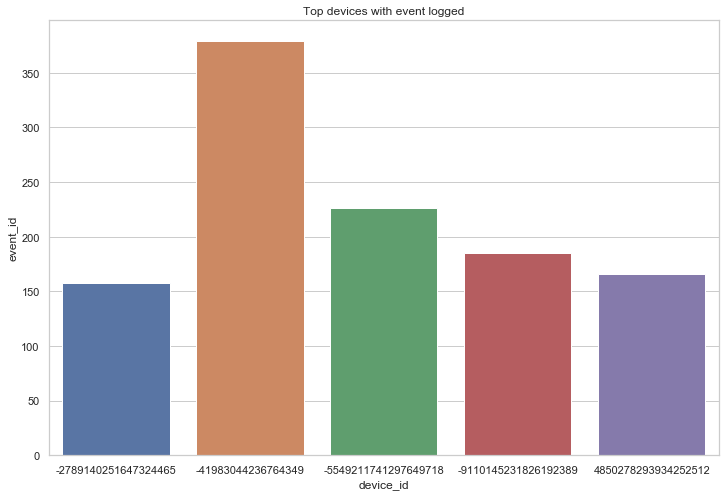

In [0]:
fig=plt.figure(figsize=(12,8))
sns.set(style="whitegrid")
sns.barplot(x='device_id',y='event_id',data=utr_top5_device_event)
plt.title('Top devices with event logged')
plt.show()

In [0]:
df_events_utr.groupby(['latitude','longitude'])['event_id'].count()
utr_top10_event_loc=df_events_utr.groupby(['latitude','longitude'])['event_id'].count().nlargest(100)
utr_top10_event_loc=utr_top10_event_loc.reset_index()
utr_top10_event_loc

,latitude,longitude,event_id
0,29.296452,79.043694,379
1,29.302013,79.001114,226
2,29.254551,79.037949,185
3,29.245489,78.985847,166
4,29.282818,79.552673,158
...,...,...,...
95,30.178368,78.316788,18
96,30.200550,78.322418,18
97,30.356724,77.988922,17
98,30.409973,78.033302,17


In [0]:
location=utr_top10_event_loc[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], tiles='OpenStreetMap')
for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point]).add_to(base_map)
base_map

- 7720 unique records with 258 unique device_id
- kashipur has highest record count of 1711 out of 8 cities recorded
- May 1 and May 3 have highest event recorded

In [0]:
location=df_events_utr[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], control_scale=True, zoom_start=12, tiles='OpenStreetMap')
HeatMap(location, min_opacity=0, overlay=False, blur=20).add_to(base_map)
base_map

**Analysis on events_data - Jammu and Kashmir**

In [0]:
df_events_jk=pd.DataFrame()
sqlujk="select event_id, CAST(device_id as CHAR) device_id, timestamp, longitude, latitude, city, state from events_data where state in  ('JammuandKashmir')"

In [0]:
df_events_jk=get_data(sqlujk)
df_events_jk.head()

Connected to MySQL Server version 5.6.46-cll-lve
MySQL connection is closed


,event_id,device_id,timestamp,longitude,latitude,city,state
0,21771,345465158970686742,2016-05-03 19:35:53,75.242622,33.808079,Anantnag,JammuandKashmir
1,23486,345465158970686742,2016-05-03 20:04:00,75.242622,33.808079,Anantnag,JammuandKashmir
2,23739,345465158970686742,2016-05-04 20:36:53,75.242622,33.808079,Anantnag,JammuandKashmir
3,23740,345465158970686742,2016-05-04 20:47:17,75.242622,33.808079,Anantnag,JammuandKashmir
4,44968,345465158970686742,2016-05-02 13:55:56,75.242622,33.808079,Anantnag,JammuandKashmir


In [0]:
df_events_jk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5385 entries, 0 to 5384
Data columns (total 7 columns):
event_id     5385 non-null int64
device_id    5385 non-null object
timestamp    5385 non-null datetime64[ns]
longitude    5385 non-null float64
latitude     5385 non-null float64
city         5385 non-null object
state        5385 non-null object
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 294.6+ KB


In [0]:
df_events_jk.isnull().sum()

event_id     0
device_id    0
timestamp    0
longitude    0
latitude     0
city         0
state        0
dtype: int64

No NULL values

In [0]:
len(df_events_jk.device_id.unique())

236

In [0]:
df_events_jk.shape

(5385, 7)

In [0]:
df_events_jk['Date']=df_events_jk.timestamp.dt.date
df_events_jk['Time']=df_events_jk.timestamp.dt.time
#df_events_jk.drop('timestamp', axis=1, inplace=True)
df_events_jk.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
0,21771,345465158970686742,2016-05-03 19:35:53,75.242622,33.808079,Anantnag,JammuandKashmir,2016-05-03,19:35:53
1,23486,345465158970686742,2016-05-03 20:04:00,75.242622,33.808079,Anantnag,JammuandKashmir,2016-05-03,20:04:00
2,23739,345465158970686742,2016-05-04 20:36:53,75.242622,33.808079,Anantnag,JammuandKashmir,2016-05-04,20:36:53
3,23740,345465158970686742,2016-05-04 20:47:17,75.242622,33.808079,Anantnag,JammuandKashmir,2016-05-04,20:47:17
4,44968,345465158970686742,2016-05-02 13:55:56,75.242622,33.808079,Anantnag,JammuandKashmir,2016-05-02,13:55:56


In [0]:
state_jk_list=list(df_events_jk.city.unique())
state_jk_list

['Anantnag', 'Kathua', 'Jammu', 'Sopur', 'Udhampur', 'Baramula', 'Srinagar']

**Event logged city wise**

In [0]:
jk_top10_city_event=df_events_jk.groupby('city')['event_id'].count().nlargest(10)
jk_top10_city_event=jk_top10_city_event.reset_index()
jk_top10_city_event

,city,event_id
0,Anantnag,1103
1,Sopur,961
2,Kathua,944
3,Jammu,771
4,Udhampur,745
5,Baramula,519
6,Srinagar,342


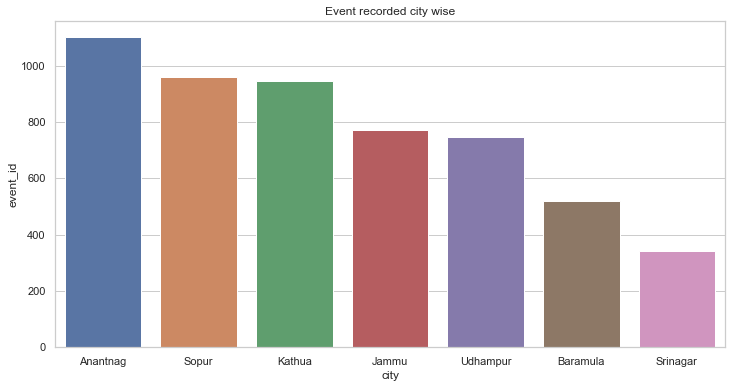

In [0]:
fig=plt.figure(figsize=(12,6))
sns.set(style="whitegrid")
sns.barplot(x='city',y='event_id',data=jk_top10_city_event)
plt.title('Event recorded city wise')
plt.show()

Anantnag has highest count of events registered, followed by Sopur and Kathua

Biggest city and capital  - Srinagar is not in top 5 cities with highest count of events while Jammu city is at 4th in the list

**Event logged date wise**

In [0]:
jk_top5_date_event=df_events_jk.groupby('Date')['event_id'].count().nlargest(5)
jk_top5_date_event=jk_top5_date_event.reset_index()
jk_top5_date_event

,Date,event_id
0,2016-05-02,827
1,2016-05-01,812
2,2016-05-04,810
3,2016-05-06,808
4,2016-05-03,771


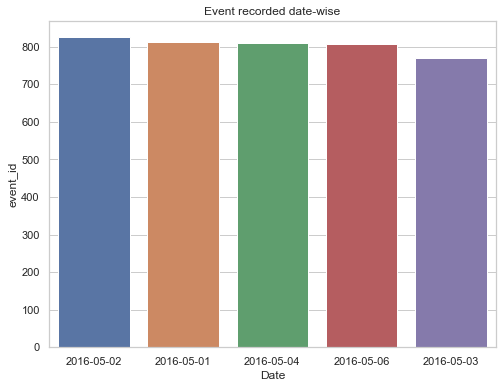

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Date',y='event_id',data=jk_top5_date_event)
plt.title('Event recorded date-wise')
plt.show()

Almost all top days have equal counts of events registered, but weekday are in top 5 apart from 6 May which is weekend

**Event logged time wise**

In [0]:
jk_top5_time_event=df_events_jk.groupby('Time')['event_id'].count().nlargest(5)
jk_top5_time_event=jk_top5_time_event.reset_index()
jk_top5_time_event

,Time,event_id
0,04:22:33,6
1,04:22:03,5
2,04:21:33,4
3,04:23:03,3
4,04:23:33,3


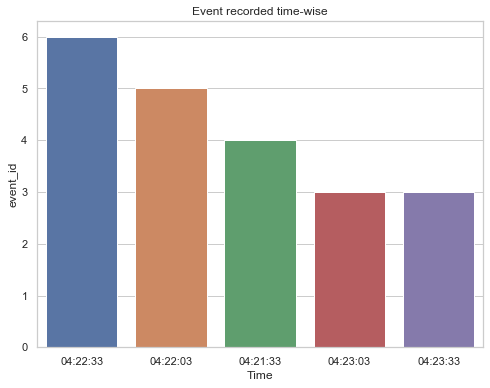

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Time',y='event_id',data=jk_top5_time_event)
plt.title('Event recorded time-wise')
plt.show()

Morning 4 AM has highets counts registered

**Event logged for devices**

In [0]:
jk_top5_device_event=df_events_mp.groupby('device_id')['event_id'].count().nlargest(5)
jk_top5_device_event=jk_top5_device_event.reset_index()
jk_top5_device_event

,device_id,event_id
0,3751556080923780612,1507
1,4113023436861671597,1157
2,-1752057305775059707,1084
3,-8790560034584248901,810
4,3738280493453802895,797


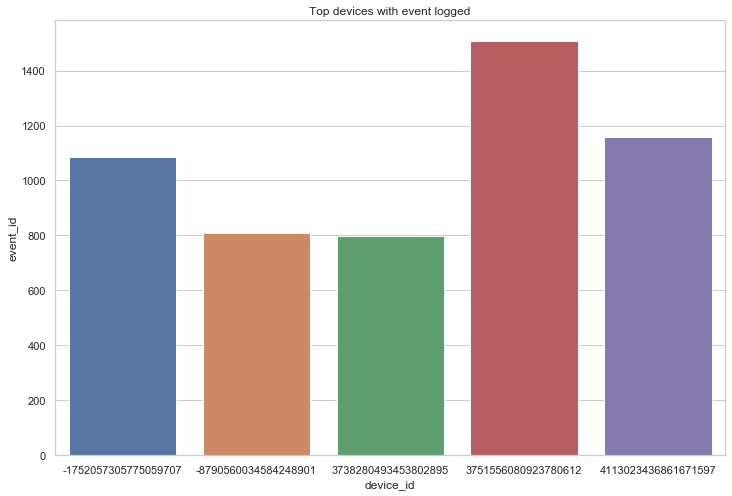

In [0]:
fig=plt.figure(figsize=(12,8))
sns.set(style="whitegrid")
sns.barplot(x='device_id',y='event_id',data=jk_top5_device_event)
plt.title('Top devices with event logged')
plt.show()

In [0]:
df_events_jk.groupby(['latitude','longitude'])['event_id'].count()
jk_top10_event_loc=df_events_jk.groupby(['latitude','longitude'])['event_id'].count().nlargest(100)
jk_top10_event_loc=jk_top10_event_loc.reset_index()
jk_top10_event_loc

,latitude,longitude,event_id
0,33.808079,75.242622,251
1,32.733620,74.947220,215
2,33.022030,75.187363,195
3,32.396137,75.554832,137
4,33.765133,75.213928,111
...,...,...,...
95,34.381386,74.512344,14
96,33.749657,75.188576,13
97,34.118450,74.839272,13
98,34.145325,74.870667,13


In [0]:
location=jk_top10_event_loc[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], tiles='OpenStreetMap')
for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point]).add_to(base_map)
base_map

Anantnag has highest count of events registered

In [0]:
location=df_events_jk[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], control_scale=True, zoom_start=12, tiles='OpenStreetMap')
HeatMap(location, min_opacity=0, overlay=False, blur=20).add_to(base_map)
base_map

- Duration from 1 May to 7 May
- 5385 records with 236 unique values
- Anantnag has maximum count of records from 7 cities
- May 2 and May 3 have  highest event recorded
- 4 AM has highest events recorded

**Analysis of events_data - Goa**

In [0]:
df_events_goa=pd.DataFrame()
sqlgoa="select event_id, CAST(device_id as CHAR) device_id, timestamp, longitude, latitude, city, state from events_data where state in  ('Goa')"

In [0]:
df_events_goa=get_data(sqlgoa)
df_events_goa.head()

Connected to MySQL Server version 5.6.46-cll-lve
MySQL connection is closed


,event_id,device_id,timestamp,longitude,latitude,city,state
0,20984,-6751207669980900563,2016-05-06 18:23:03,73.973602,15.317287,Madgaon,Goa
1,33979,-6751207669980900563,2016-05-04 06:02:36,73.973602,15.317287,Madgaon,Goa
2,104768,-6751207669980900563,2016-05-07 15:11:31,73.973602,15.317287,Madgaon,Goa
3,135615,-6751207669980900563,2016-05-07 15:10:31,73.973602,15.317287,Madgaon,Goa
4,420749,-6751207669980900563,2016-05-07 15:12:39,73.973602,15.317287,Madgaon,Goa


In [0]:
df_events_goa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3250 entries, 0 to 3249
Data columns (total 7 columns):
event_id     3250 non-null int64
device_id    3250 non-null object
timestamp    3250 non-null datetime64[ns]
longitude    3250 non-null float64
latitude     3250 non-null float64
city         3250 non-null object
state        3250 non-null object
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 177.9+ KB


In [0]:
df_events_goa.isnull().sum()

event_id     0
device_id    0
timestamp    0
longitude    0
latitude     0
city         0
state        0
dtype: int64

No NULL values

In [0]:
len(df_events_goa.device_id.unique())

76

In [0]:
df_events_goa.shape

(3250, 7)

**Splitting timestamp to Date and Time**

In [0]:
df_events_goa['Date']=df_events_goa.timestamp.dt.date
df_events_goa['Time']=df_events_goa.timestamp.dt.time
#df_events_goa.drop('timestamp', axis=1, inplace=True)
df_events_goa.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
0,20984,-6751207669980900563,2016-05-06 18:23:03,73.973602,15.317287,Madgaon,Goa,2016-05-06,18:23:03
1,33979,-6751207669980900563,2016-05-04 06:02:36,73.973602,15.317287,Madgaon,Goa,2016-05-04,06:02:36
2,104768,-6751207669980900563,2016-05-07 15:11:31,73.973602,15.317287,Madgaon,Goa,2016-05-07,15:11:31
3,135615,-6751207669980900563,2016-05-07 15:10:31,73.973602,15.317287,Madgaon,Goa,2016-05-07,15:10:31
4,420749,-6751207669980900563,2016-05-07 15:12:39,73.973602,15.317287,Madgaon,Goa,2016-05-07,15:12:39


In [0]:
states_goa_list=list(df_events_goa.city.unique())
states_goa_list

['Madgaon', 'Mormugao', 'Panaji']

**Event recorded city wise**

In [0]:
goa_top10_city_event=df_events_goa.groupby('city')['event_id'].count().nlargest(10)
goa_top10_city_event=goa_top10_city_event.reset_index()
goa_top10_city_event

,city,event_id
0,Mormugao,2352
1,Madgaon,497
2,Panaji,401


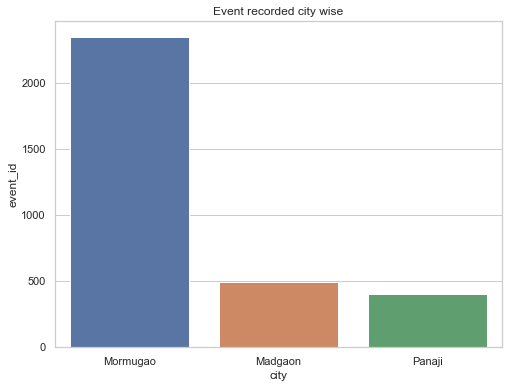

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='city',y='event_id',data=goa_top10_city_event)
plt.title('Event recorded city wise')
plt.show()

Mormugao has highest count and Panaji has least

**Event recorded date wise**

In [0]:
goa_top5_date_event=df_events_goa.groupby('Date')['event_id'].count().nlargest(5)
goa_top5_date_event=goa_top5_date_event.reset_index()
goa_top5_date_event

,Date,event_id
0,2016-05-02,505
1,2016-05-04,495
2,2016-05-01,486
3,2016-05-05,458
4,2016-05-03,446


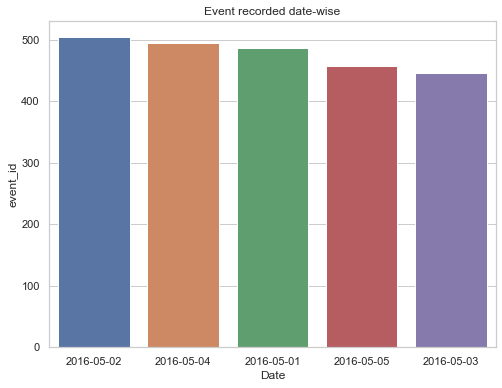

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Date',y='event_id',data=goa_top5_date_event)
plt.title('Event recorded date-wise')
plt.show()

02 May and 04 May has highets event recorded

**Event recorded time wise**

In [0]:
goa_top5_time_event=df_events_goa.groupby('Time')['event_id'].count().nlargest(5)
goa_top5_time_event=goa_top5_time_event.reset_index()
goa_top5_time_event

,Time,event_id
0,00:05:30,5
1,00:06:00,5
2,00:06:30,4
3,00:04:30,3
4,00:04:31,3


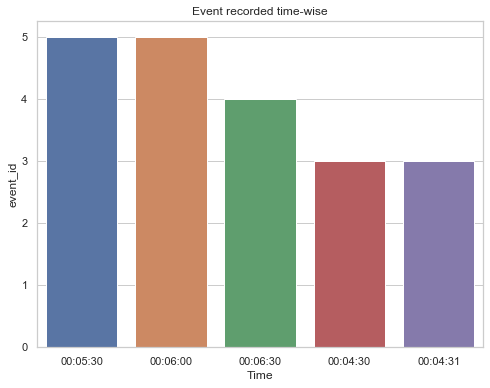

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Time',y='event_id',data=goa_top5_time_event)
plt.title('Event recorded time-wise')
plt.show()

Midnight has maximum events recorded

**Event recorded for devices**

In [0]:
goa_top5_device_event=df_events_goa.groupby('device_id')['event_id'].count().nlargest(5)
goa_top5_device_event=goa_top5_device_event.reset_index()
goa_top5_device_event

,device_id,event_id
0,3992361992277142040,448
1,5388499639796252565,325
2,-4374356101743562672,240
3,-8273701417712267743,233
4,-21898461299279926,172


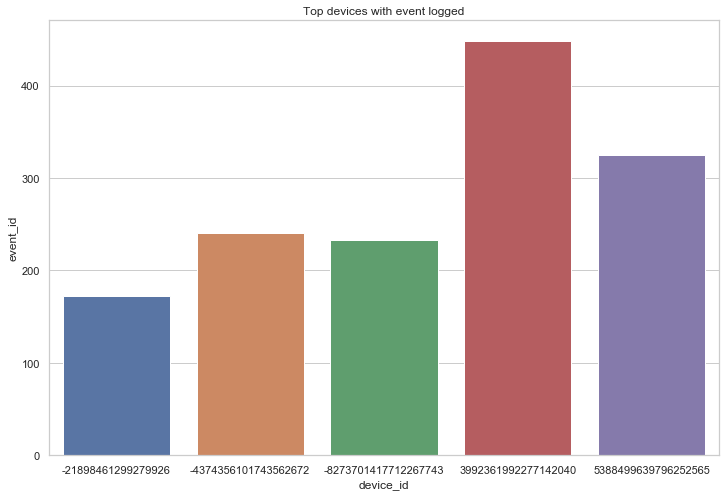

In [0]:
fig=plt.figure(figsize=(12,8))
sns.set(style="whitegrid")
sns.barplot(x='device_id',y='event_id',data=goa_top5_device_event)
plt.title('Top devices with event logged')
plt.show()

In [0]:
df_events_goa.groupby(['latitude','longitude'])['event_id'].count()
goa_top10_event_loc=df_events_goa.groupby(['latitude','longitude'])['event_id'].count().nlargest(100)
goa_top10_event_loc=goa_top10_event_loc.reset_index()
goa_top10_event_loc

,latitude,longitude,event_id
0,15.501799,73.810043,448
1,15.436396,73.822525,325
2,15.444478,73.860062,240
3,15.464562,73.825768,233
4,15.456724,73.842293,172
...,...,...,...
71,15.541707,73.884117,1
72,15.578149,73.856049,1
73,15.583724,73.873459,1
74,15.528800,73.896278,1


In [0]:
location=goa_top10_event_loc[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], tiles='OpenStreetMap')
for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point]).add_to(base_map)
base_map

Some latitude and longitude seems incorrect

In [0]:
location=df_events_goa[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], control_scale=True, zoom_start=12, tiles='OpenStreetMap')
HeatMap(location, min_opacity=0, overlay=False, blur=20).add_to(base_map)
base_map

- Duration from 30 Apr 2016 to 7 May 2016
- May 2 and May 4 have highest recorded event
- 3250 records with 76 unique device_id
- device_id is numeric
- data for 3 cities with Mormugao has highest record count - 2352
- Midnight hours recorded most events

**Analysis of events_data - Nagaland**

In [0]:
df_events_nag=pd.DataFrame()
sqlnag="select event_id, CAST(device_id as CHAR) device_id, timestamp, longitude, latitude, city, state from events_data where state in  ('Nagaland')"

In [0]:
df_events_nag=get_data(sqlnag)
df_events_nag.head()

Connected to MySQL Server version 5.6.46-cll-lve
MySQL connection is closed


,event_id,device_id,timestamp,longitude,latitude,city,state
0,22093,9132041579920627992,2016-05-04 19:03:15,94.354393,26.183962,Wokha,Nagaland
1,22794,9132041579920627992,2016-05-07 19:37:42,94.354393,26.183962,Wokha,Nagaland
2,55519,9132041579920627992,2016-05-05 19:22:27,94.354393,26.183962,Wokha,Nagaland
3,55692,9132041579920627992,2016-05-05 19:17:15,94.354393,26.183962,Wokha,Nagaland
4,102376,9132041579920627992,2016-05-04 19:01:14,94.354393,26.183962,Wokha,Nagaland


In [0]:
df_events_nag.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2298 entries, 0 to 2297
Data columns (total 7 columns):
event_id     2298 non-null int64
device_id    2298 non-null object
timestamp    2298 non-null datetime64[ns]
longitude    2298 non-null float64
latitude     2298 non-null float64
city         2298 non-null object
state        2298 non-null object
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 125.8+ KB


In [0]:
df_events_nag.isnull().sum()

event_id     0
device_id    0
timestamp    0
longitude    0
latitude     0
city         0
state        0
dtype: int64

In [0]:
df_events_nag.shape

(2298, 7)

In [0]:
len(df_events_nag.device_id.unique())

107

**Splitting timestamp to Date and Time**

In [0]:
df_events_nag['Date']=df_events_nag.timestamp.dt.date
df_events_nag['Time']=df_events_nag.timestamp.dt.time
#df_events_nag.drop('timestamp', axis=1, inplace=True)
df_events_nag.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
0,22093,9132041579920627992,2016-05-04 19:03:15,94.354393,26.183962,Wokha,Nagaland,2016-05-04,19:03:15
1,22794,9132041579920627992,2016-05-07 19:37:42,94.354393,26.183962,Wokha,Nagaland,2016-05-07,19:37:42
2,55519,9132041579920627992,2016-05-05 19:22:27,94.354393,26.183962,Wokha,Nagaland,2016-05-05,19:22:27
3,55692,9132041579920627992,2016-05-05 19:17:15,94.354393,26.183962,Wokha,Nagaland,2016-05-05,19:17:15
4,102376,9132041579920627992,2016-05-04 19:01:14,94.354393,26.183962,Wokha,Nagaland,2016-05-04,19:01:14


In [0]:
states_ng_list=list(df_events_nag.city.unique())
states_ng_list

['Wokha', 'Dimapur', 'Kohima']

**Event recorded city wise**

In [0]:
ng_top10_city_event=df_events_nag.groupby('city')['event_id'].count().nlargest(10)
ng_top10_city_event=ng_top10_city_event.reset_index()
ng_top10_city_event

,city,event_id
0,Wokha,1100
1,Kohima,614
2,Dimapur,584


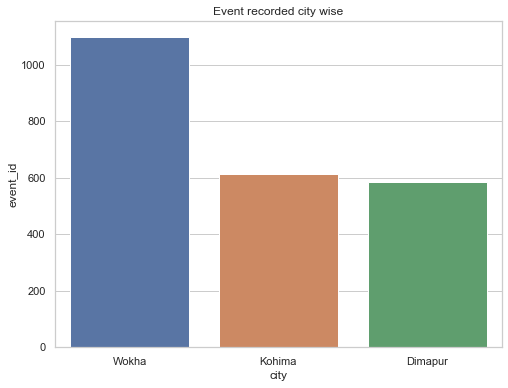

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='city',y='event_id',data=ng_top10_city_event)
plt.title('Event recorded city wise')
plt.show()

Wokha has highest events recorded followed by capital- Kohima and largest city Dimapur has lowest count

**Event recorded date wise**

In [0]:
ng_top5_date_event=df_events_nag.groupby('Date')['event_id'].count().nlargest(5)
ng_top5_date_event=ng_top5_date_event.reset_index()
ng_top5_date_event

,Date,event_id
0,2016-05-07,369
1,2016-05-05,366
2,2016-05-06,362
3,2016-05-01,361
4,2016-05-04,357


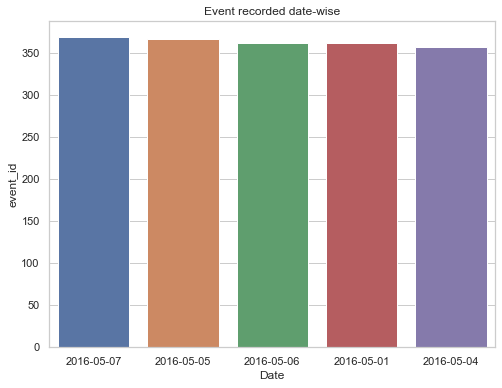

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Date',y='event_id',data=ng_top5_date_event)
plt.title('Event recorded date-wise')
plt.show()

Almost all days have similar count

**Event recorded time wise**

In [0]:
ng_top5_time_event=df_events_nag.groupby('Time')['event_id'].count().nlargest(5)
ng_top5_time_event=ng_top5_time_event.reset_index()
ng_top5_time_event

,Time,event_id
0,18:20:11,8
1,21:27:43,5
2,21:28:13,5
3,21:28:43,5
4,21:29:13,5


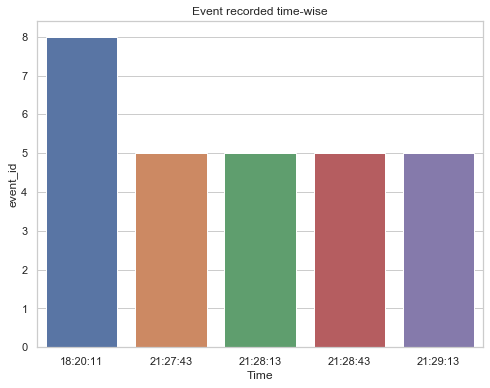

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='Time',y='event_id',data=ng_top5_time_event)
plt.title('Event recorded time-wise')
plt.show()

6 PM has highest count followed around 9:30 PM

**Event recorded for devices**

In [0]:
ng_top5_device_event=df_events_nag.groupby('device_id')['event_id'].count().nlargest(5)
ng_top5_device_event=ng_top5_device_event.reset_index()
ng_top5_device_event

,device_id,event_id
0,9132041579920627992,244
1,5213783467221875757,183
2,-5696849591913476710,152
3,2243613946498943264,147
4,7011237962868114666,86


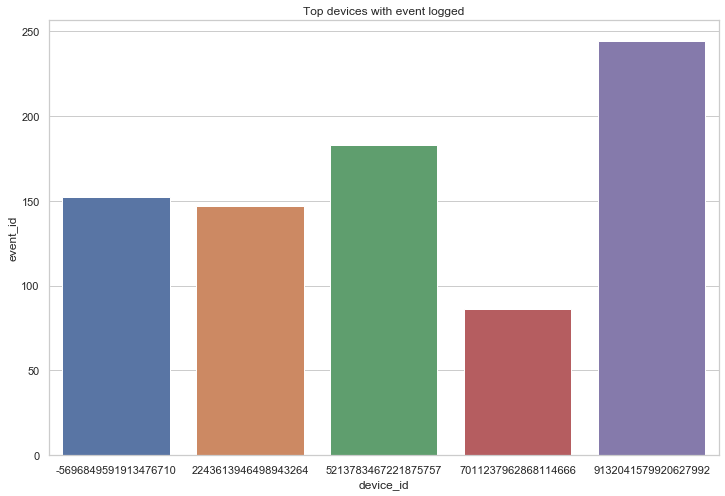

In [0]:
fig=plt.figure(figsize=(12,8))
sns.set(style="whitegrid")
sns.barplot(x='device_id',y='event_id',data=ng_top5_device_event)
plt.title('Top devices with event logged')
plt.show()

In [0]:
df_events_nag.groupby(['latitude','longitude'])['event_id'].count()
nag_top10_event_loc=df_events_nag.groupby(['latitude','longitude'])['event_id'].count().nlargest(100)
nag_top10_event_loc=nag_top10_event_loc.reset_index()
nag_top10_event_loc

,latitude,longitude,event_id
0,26.183962,94.354393,244
1,26.129629,94.286026,183
2,25.701239,94.140823,152
3,26.120228,94.356133,147
4,25.970480,93.765625,86
...,...,...,...
95,25.725203,94.148773,1
96,25.745737,94.164886,1
97,25.747587,94.199417,1
98,25.760735,94.154037,1


In [0]:
location=nag_top10_event_loc[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], tiles='OpenStreetMap')
for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point]).add_to(base_map)
base_map

In [0]:
location=df_events_nag[['latitude','longitude']]
locationlist=location.values.tolist()
loc=len(locationlist)-1
base_map = folium.Map(location=locationlist[loc], control_scale=True, zoom_start=12, tiles='OpenStreetMap')
HeatMap(location, min_opacity=0, overlay=False, blur=20).add_to(base_map)
base_map

- 2298 records with 107 unique device_id
- Wokha has highest count out of 3 cities recorded.
- Duration from May 1 to May 7 2016
- May 7 and May 5 have highest event recorded

**Combining dataset for each state**

There are some negative device_id observed which need to be corrected

In [0]:
df_events_mp.device_id=df_events_mp.device_id.astype(np.int64)
df_events_mp.device_id=df_events_mp.device_id.abs()

In [0]:
df_events_cht.device_id=df_events_cht.device_id.astype(np.int64)
df_events_cht.device_id=df_events_cht.device_id.abs()

In [0]:
df_events_utr.device_id=df_events_utr.device_id.astype(np.int64)
df_events_utr.device_id=df_events_utr.device_id.abs()

In [0]:
df_events_jk.device_id=df_events_jk.device_id.astype(np.int64)
df_events_jk.device_id=df_events_jk.device_id.abs()

In [0]:
df_events_goa.device_id=df_events_goa.device_id.astype(np.int64)
df_events_goa.device_id=df_events_goa.device_id.abs()

In [0]:
df_events_nag.device_id=df_events_nag.device_id.astype(np.int64)
df_events_nag.device_id=df_events_nag.device_id.abs()

In [0]:
df_event_data=pd.concat([df_events_mp,df_events_cht,df_events_utr,df_events_jk,df_events_goa,df_events_nag])
df_event_data.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
0,10117,5323073305882503557,2016-05-01 11:11:24,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,11:11:24
1,112369,5323073305882503557,2016-05-04 22:47:19,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-04,22:47:19
2,139098,5323073305882503557,2016-05-01 09:55:58,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,09:55:58
3,190983,5323073305882503557,2016-05-04 22:51:03,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-04,22:51:03
4,249507,5323073305882503557,2016-05-01 11:24:12,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,11:24:12


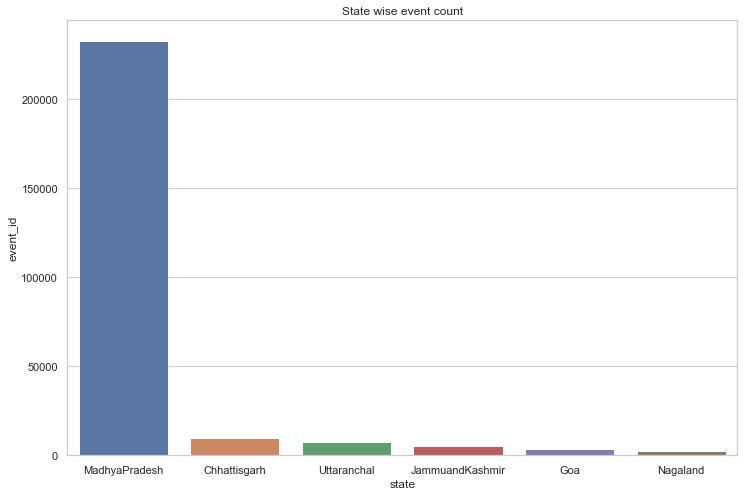

In [0]:
tmp=df_event_data.groupby(by='state')['event_id'].count().nlargest(8)
tmp=tmp.reset_index()
fig=plt.figure(figsize=(12,8))
sns.barplot(x='state', y='event_id', data=tmp)
plt.title('State wise event count')
plt.show()

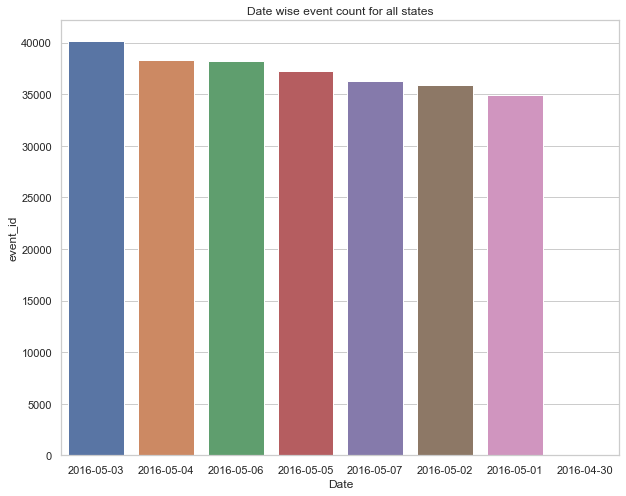

In [0]:
tmp=df_event_data.groupby(by='Date')['event_id'].count().nlargest(8)
tmp=tmp.reset_index()
fig=plt.figure(figsize=(10,8))
sns.barplot(x='Date', y='event_id', data=tmp)
plt.title('Date wise event count for all states')
plt.show()

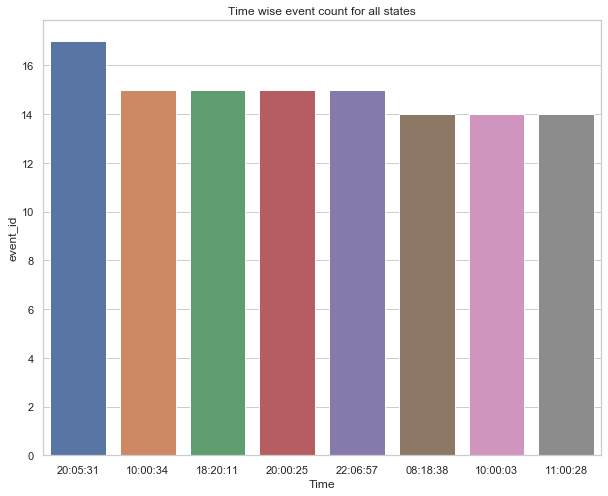

In [0]:
tmp=df_event_data.groupby(by='Time')['event_id'].count().nlargest(8)
tmp=tmp.reset_index()
fig=plt.figure(figsize=(10,8))
sns.barplot(x='Time', y='event_id', data=tmp)
plt.title('Time wise event count for all states')
plt.show()

In [0]:
event_city_list=state_mp_list+state_cht_list+state_utr_list+state_jk_list+states_goa_list+states_ng_list

#event_city_list

**Analysis of gender_age_train dataset**

In [0]:
df_gender_age_train=pd.DataFrame()
sql_gender_age="select * from gender_age_train where device_id in (select device_id from events_data where state in ('MadhyaPradesh','Chhattisgarh','Uttaranchal','JammuandKashmir','Goa','Nagaland'))"

In [0]:
df_gender_age_train=get_data(sql_gender_age)
df_gender_age_train.head()

Connected to MySQL Server version 5.6.46-cll-lve
MySQL connection is closed


,device_id,gender,age,group
0,2313145512701915151,M,34,M32-38
1,-1539979963116391306,M,31,M29-31
2,-7731743086143077949,M,35,M32-38
3,-4370696809239943432,M,36,M32-38
4,2959524852145775517,M,30,M29-31


In [0]:
len(df_gender_age_train.device_id.unique())

4297

In [0]:
df_gender_age_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4297 entries, 0 to 4296
Data columns (total 4 columns):
device_id    4297 non-null int64
gender       4297 non-null object
age          4297 non-null int64
group        4297 non-null object
dtypes: int64(2), object(2)
memory usage: 134.4+ KB


In [0]:
df_gender_age_train.isnull().sum()

device_id    0
gender       0
age          0
group        0
dtype: int64

In [0]:
df_gender_age_train[df_gender_age_train.device_id<0].count()

device_id    2222
gender       2222
age          2222
group        2222
dtype: int64

2222 device_id are -ve out of 4297

In [0]:
df_gender_age_train.groupby(by='gender')['device_id'].count()

gender
F    1595
M    2702
Name: device_id, dtype: int64

In [0]:
tmp=pd.DataFrame(df_gender_age_train.groupby(by='gender')['device_id'].count())
tmp=tmp.reset_index()
tmp

,gender,device_id
0,F,1595
1,M,2702


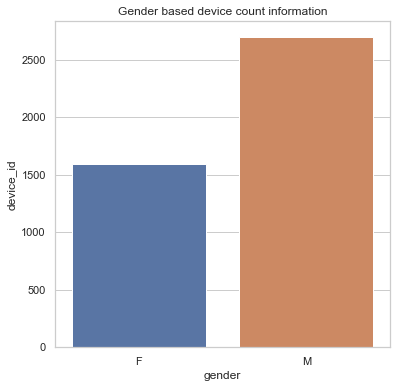

In [0]:
fig=plt.figure(figsize=(6,6))
sns.barplot(x='gender', y='device_id' , data=tmp)
plt.title("Gender based device count information")
plt.show()

In [0]:
df_gender_age_train.groupby(by='age').count().sort_values(by='device_id')

,device_id,gender,group
age,,,
6,1,1,1
79,1,1,1
78,1,1,1
74,1,1,1
70,1,1,1
...,...,...,...
30,223,223,223
26,238,238,238
25,244,244,244


In [0]:
tmp=df_gender_age_train.groupby(by='age')['device_id'].count()
tmp=tmp.reset_index()
tmp

,age,device_id
0,6,1
1,10,1
2,11,1
3,12,1
4,14,2
...,...,...
63,75,2
64,78,1
65,79,1
66,83,1


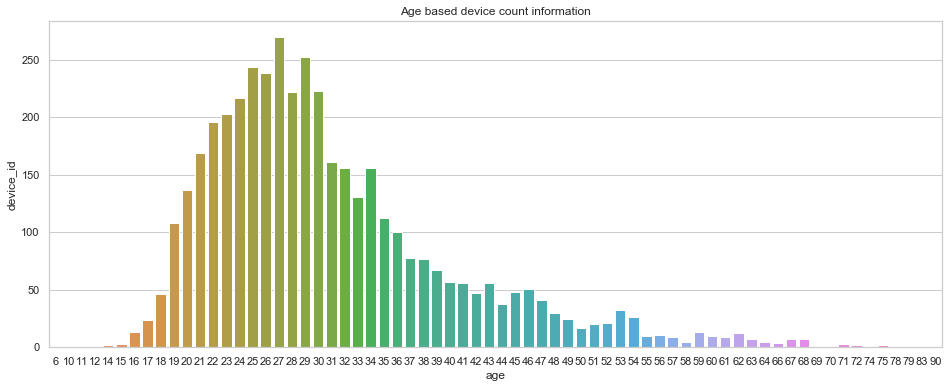

In [0]:
fig=plt.figure(figsize=(16,6))
sns.barplot(x='age', y='device_id' , data=tmp)
plt.title("Age based device count information")
plt.show()

In [0]:
df_gender_age_train.groupby(by='age')['device_id'].count().nlargest(10)

age
27    270
29    252
25    244
26    238
30    223
28    222
24    217
23    203
22    196
21    169
Name: device_id, dtype: int64

In [0]:
df_gender_age_train.groupby(by='age')['device_id'].count().nsmallest(15)

age
6     1
10    1
11    1
12    1
69    1
70    1
74    1
78    1
79    1
83    1
90    1
14    2
72    2
75    2
15    3
Name: device_id, dtype: int64

In [0]:
#Split group data into 2 columns
df_gender_age_train['group gender']=df_gender_age_train.group.str[0]
df_gender_age_train['group age']=df_gender_age_train.group.str[1:]
df_gender_age_train.drop('group', axis=1, inplace=True)
df_gender_age_train.head()

,device_id,gender,age,group gender,group age
0,2313145512701915151,M,34,M,32-38
1,-1539979963116391306,M,31,M,29-31
2,-7731743086143077949,M,35,M,32-38
3,-4370696809239943432,M,36,M,32-38
4,2959524852145775517,M,30,M,29-31


In [0]:
df_gender_age_train[(df_gender_age_train.gender!=df_gender_age_train['group gender'])]

,device_id,gender,age,group gender,group age


Gender in group age matches with values in gender column, so group gender can be droppped

In [0]:
df_gender_age_train.drop('group gender', axis=1, inplace=True)

In [0]:
df_gender_age_train.groupby(by='group age').count()

,device_id,gender,age
group age,,,
22-,449,449,449
23-,337,337,337
23-26,578,578,578
24-26,240,240,240
27-28,492,492,492
29-31,388,388,388
29-32,299,299,299
32-38,548,548,548
33-42,306,306,306


In [0]:
df_gender_age_train.groupby(by='group age')['age'].describe()

,count,mean,std,min,25%,50%,75%,max
group age,,,,,,,,
22-,449.0,20.126949,1.857516,6.0,19.0,20.0,22.0,22.0
23-,337.0,21.080119,1.781884,11.0,20.0,21.0,22.0,23.0
23-26,578.0,24.619377,1.095337,23.0,24.0,25.0,26.0,26.0
24-26,240.0,25.012500,0.805220,24.0,24.0,25.0,26.0,26.0
27-28,492.0,27.451220,0.498121,27.0,27.0,27.0,28.0,28.0
29-31,388.0,29.912371,0.785891,29.0,29.0,30.0,31.0,31.0
29-32,299.0,30.150502,1.111604,29.0,29.0,30.0,31.0,32.0
32-38,548.0,34.474453,1.912454,32.0,33.0,34.0,36.0,38.0
33-42,306.0,36.833333,2.864423,33.0,34.0,36.0,39.0,42.0


In [0]:
df_age_group=pd.DataFrame(df_gender_age_train.groupby('group age')['device_id'].count())
df_age_group.columns=['age group count']
df_age_group

,age group count
group age,
22-,449
23-,337
23-26,578
24-26,240
27-28,492
29-31,388
29-32,299
32-38,548
33-42,306


In [0]:
x1=df_gender_age_train[df_gender_age_train.age<=22]['device_id'].count()
x2=df_gender_age_train[df_gender_age_train.age<=23]['device_id'].count()
x3=df_gender_age_train[(df_gender_age_train.age>=23) & (df_gender_age_train.age<=26)]['device_id'].count()
x4=df_gender_age_train[(df_gender_age_train.age>=24) & (df_gender_age_train.age<=26)]['device_id'].count()
x5=df_gender_age_train[(df_gender_age_train.age>=27) & (df_gender_age_train.age<=28)]['device_id'].count()
x6=df_gender_age_train[(df_gender_age_train.age>=29) & (df_gender_age_train.age<=31)]['device_id'].count()
x7=df_gender_age_train[(df_gender_age_train.age>=29) & (df_gender_age_train.age<=32)]['device_id'].count()
x8=df_gender_age_train[(df_gender_age_train.age>=32) & (df_gender_age_train.age<=38)]['device_id'].count()
x9=df_gender_age_train[(df_gender_age_train.age>=33) & (df_gender_age_train.age<=42)]['device_id'].count()
x10=df_gender_age_train[(df_gender_age_train.age>=39)]['device_id'].count()
x11=df_gender_age_train[(df_gender_age_train.age>=43)]['device_id'].count()
df_age_group['age count']=[x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11]
df_age_group

,age group count,age count
group age,,
22-,449,702
23-,337,905
23-26,578,902
24-26,240,699
27-28,492,492
29-31,388,636
29-32,299,792
32-38,548,810
33-42,306,881


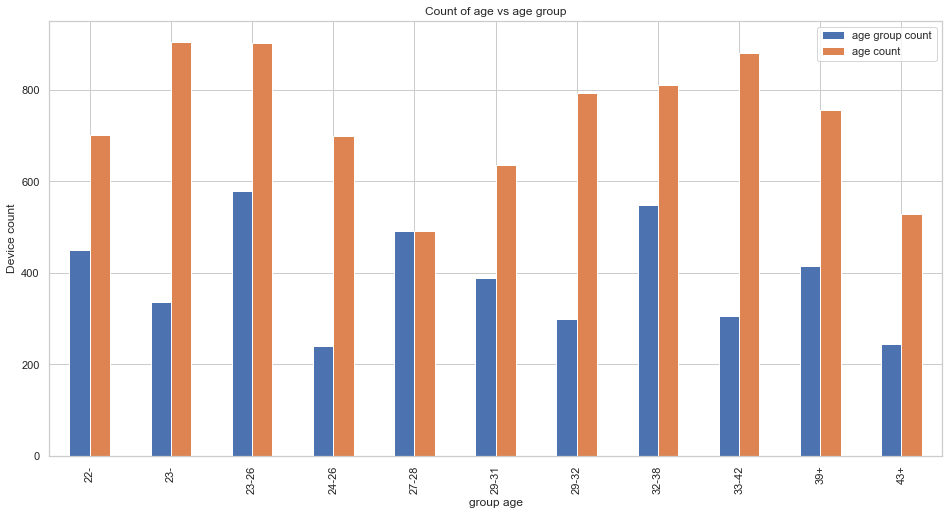

In [0]:
plt.rcParams['figure.figsize']=(16,8)
df_age_group.plot.bar()
plt.title('Count of age vs age group')
plt.ylabel("Device count")
plt.show()

- No NULL values
- 4927 device_id not matching with count of device_id in events_data(4298)
- After removing -ve from device_id(count=2222), no duplicate records
- The group column data seems inconsistent and can be dropped.
- Age with 27,29,25,26 have highest record count
- Age with 6,10,11,12,69,70,74,78,79,83,90 have lowest count of 1 each
- 1595 records for female
- 2702 records for male

**Analysis of phone_brand_device_model dataset**

In [0]:
sql_phone_brand="select * from phone_brand_device_model where device_id in (select device_id from events_data where state in ('MadhyaPradesh','Chhattisgarh','Uttaranchal','JammuandKashmir','Goa','Nagaland'))"
df_phone_brand_device_model=pd.DataFrame()

In [0]:
df_phone_brand_device_model=get_data(sql_phone_brand)
df_phone_brand_device_model.head()

Connected to MySQL Server version 5.6.46-cll-lve
MySQL connection is closed


,device_id,phone_brand,device_model
0,2313145512701915151,vivo,Xplay
1,-1539979963116391306,小米,GN708W
2,-7731743086143077949,小米,红米
3,-4370696809239943432,小米,MI 2S
4,2959524852145775517,三星,A850


In [0]:
df_phone_brand_device_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4297 entries, 0 to 4296
Data columns (total 3 columns):
device_id       4297 non-null int64
phone_brand     4297 non-null object
device_model    4297 non-null object
dtypes: int64(1), object(2)
memory usage: 100.8+ KB


No NULL values

In [0]:
len(df_phone_brand_device_model.device_id.unique())

4297

Each record in the dataset has unique device_id

**Replacing the chinese characters in device_model as per the information present in data description link**

In [0]:
#device_model_repl_dict={'华为':'Huawei','小米':'Xiaomi','三星':'Samsung','魅族':'Meizu','酷派':'Coolpad','乐视':'LeEco','联想':'Lenovo'}

In [0]:
def translate_values(input_list):
    output_list=[]
    for val in input_list:
        translator = Translator()
        translated=""
        print("Original :", val)
        try:
            translated=translator.translate(val, dest='en')
            print("Changed :", translated.text)
            output_list.append(translated.text)
        except Error as e:
            print("Error :", e)
            print("Using original :", val)
            output_list.append(val)
        finally:
            print ("\n")

    return output_list

In [0]:
#brand_set=set(brand_list)
#unique_brand_list=list(brand_set)
#converted_brand_list=translate_values(unique_brand_list)
#brand_df.to_csv("Brand_list.csv")
brand_df=pd.read_csv("https://raw.githubusercontent.com/AnkitNigam1985/Data-Science-Projects/master/Capstone_projects/InsaidTelcecom_customer_services/Brand_list.csv")
brand_df.drop('Unnamed: 0', axis=1, inplace=True)
brand_df

,Original,Converted
0,锤子,hammer
1,青葱,Scallion
2,海信,Hisense
3,米歌,M song
4,Lovme,Lovme
5,美图,Mito
6,SUGAR,SUGAR
7,梦米,Dream meters
8,奇酷,Cool odd
9,百立丰,One hundred Li & Fung


In [0]:
brand_df.Converted=brand_df.Converted.replace({'Millet':'Xiaomi', 'TV Plus':'LeEco'})
brand_df

,Original,Converted
0,锤子,hammer
1,青葱,Scallion
2,海信,Hisense
3,米歌,M song
4,Lovme,Lovme
5,美图,Mito
6,SUGAR,SUGAR
7,梦米,Dream meters
8,奇酷,Cool odd
9,百立丰,One hundred Li & Fung


In [0]:
#model_set=set(model_list)
#model_unique_list=list(model_set)
#model_unique_list
#converted_model_list=translate_values(model_unique_list)
#converted_model_list=translate_values(model_list)
#model_df=pd.DataFrame(zip(model_unique_list, converted_model_list), columns=['Original', 'Converted'])
#model_df.to_csv("model_data.csv")
model_df=pd.read_csv("https://raw.githubusercontent.com/AnkitNigam1985/Data-Science-Projects/master/Capstone_projects/InsaidTelcecom_customer_services/model_list.csv")
model_df.drop('Unnamed: 0', axis=1, inplace=True)
model_df

,Original,Converted
0,大器2,Generosity 2
1,荣耀4A,4A glory
2,Galaxy Win,Galaxy Win
3,5892,5892
4,HN3-U01,And Hna-01
...,...,...
671,U930HD,Situation HD 0
672,魅蓝NOTE,Charm Blue NOTE
673,V4,RF
674,MI 3,MI 3


In [0]:
df_phone_brand_device_model.head(3)

,device_id,phone_brand,device_model
0,2313145512701915151,vivo,Xplay
1,-1539979963116391306,小米,GN708W
2,-7731743086143077949,小米,红米


In [0]:
brand_df.head(3)

,Original,Converted
0,锤子,hammer
1,青葱,Scallion
2,海信,Hisense


In [0]:
model_df.head(3)

,Original,Converted
0,大器2,Generosity 2
1,荣耀4A,4A glory
2,Galaxy Win,Galaxy Win


In [0]:
brand_dict=dict(zip(brand_df.Original.tolist(), brand_df.Converted.tolist()))
brand_dict

{'锤子': 'hammer',
 '青葱': 'Scallion',
 '海信': 'Hisense',
 '米歌': 'M song',
 'Lovme': 'Lovme',
 '美图': 'Mito',
 'SUGAR': 'SUGAR',
 '梦米': 'Dream meters',
 '奇酷': 'Cool odd',
 '百立丰': 'One hundred Li & Fung',
 '海尔': 'Haier',
 '黑米': 'black rice',
 '诺基亚': 'Nokia',
 '亿通': '亿通',
 '艾优尼': 'Ai Unocal',
 '小米': 'Xiaomi',
 '一加': 'A plus',
 '摩托罗拉': 'Motorola',
 '邦华': 'Banghua',
 '欧新': 'Ou',
 '语信': 'Language letter',
 'HTC': 'HTC',
 '首云': 'Shouyun',
 '夏新': 'Amoi',
 '酷比': 'Doo',
 '先锋': 'pioneer',
 'vivo': 'vivo',
 '小杨树': 'Small poplar',
 '飞秒': 'Femtosecond',
 '纽曼': 'Newman',
 '三星': 'Samsung',
 '维图': 'Dimensional map',
 'LG': 'LG',
 '欧博信': "O'Brien letter",
 '果米': 'If the meter',
 '酷珀': 'Koku珀',
 'PPTV': 'PPTV',
 '酷派': 'Cool',
 'TCL': 'TCL',
 '酷比魔方': 'CUBE',
 '青橙': 'Green Orange',
 '乡米': 'Township meters',
 '波导': 'waveguide',
 '联想 ': 'Associate',
 '优米': 'Quality rice',
 '天语': 'Amagatarai',
 'E派': 'E school',
 '百加': 'Bacardi',
 '富可视': 'InFocus',
 '努比亚': 'Nubian',
 '华为': 'Huawei',
 '中国移动': 'China Mobile',
 '易派'

In [0]:
model_dict=dict(zip(model_df.Original.tolist(), model_df.Converted.tolist()))
model_dict

{'大器2': 'Generosity 2',
 '荣耀4A': '4A glory',
 'Galaxy Win': 'Galaxy Win',
 '5892': '5892',
 'HN3-U01': 'And Hna-01',
 'R819T': 'R819T',
 'U9508': 'Ock 08',
 'Y15': 'Y15',
 'A378t': 'Oahoudh',
 'A690': 'A690',
 'King 7s': 'King 7s',
 'T5': 'T5',
 'Galaxy S Advance': 'Galaxy S Advance',
 'C8818': 'C8818',
 'K88L': 'K88L',
 'Xperia TX': 'Xperia TX',
 'R2017': 'Revelation 017',
 'G610T': 'G610T',
 'S880i': 'S880i',
 '7295+': '7295+',
 'X5L': 'X5L',
 'Z5 Mini': 'Z5 Mini',
 'Xplay3S': 'Xplay3S',
 'G11': 'G11',
 '超级手机1 Pro': 'Super phone 1 Pro',
 '乐檬K3': 'Le lemon K3',
 '2016版 Galaxy A9': 'Version 2016 Galaxy A9',
 'MI 2A': 'MI 2A',
 'Ascend G6': 'Ascend G6',
 'U817': 'Od 17',
 'A3900': 'Aas 00',
 'Galaxy A3': 'Galaxy A3',
 'Galaxy On5': 'Galaxy On5',
 'MT1-U06': 'MT1-U06',
 'T1': 'T1',
 'M8St': 'M8St',
 'Galaxy S6': 'Galaxy S6',
 'G750-T20': 'G750-T20',
 'S5830I': 'Skhadda 0 j',
 'A688t': 'A688t',
 'Galaxy On7': 'Galaxy On7',
 'MI pad': 'MI drop',
 'V955': 'Vck',
 'Find 5': 'Find 5',
 'A820'

In [0]:
df_phone_brand_device_model.phone_brand=df_phone_brand_device_model.phone_brand.replace(brand_dict)
df_phone_brand_device_model.head()

,device_id,phone_brand,device_model
0,2313145512701915151,vivo,Xplay
1,-1539979963116391306,Xiaomi,GN708W
2,-7731743086143077949,Xiaomi,红米
3,-4370696809239943432,Xiaomi,MI 2S
4,2959524852145775517,Samsung,A850


In [0]:
df_phone_brand_device_model.device_model=df_phone_brand_device_model.device_model.replace(model_dict)
df_phone_brand_device_model.head()

,device_id,phone_brand,device_model
0,2313145512701915151,vivo,Xplay
1,-1539979963116391306,Xiaomi,GN708W
2,-7731743086143077949,Xiaomi,Red rice
3,-4370696809239943432,Xiaomi,MI 2S
4,2959524852145775517,Samsung,A850


In [0]:
top_10_brands=df_phone_brand_device_model.groupby('phone_brand')['device_id'].count().nlargest(10)
top_10_brands=top_10_brands.reset_index()
top_10_brands.head()

,phone_brand,device_id
0,Xiaomi,1038
1,Samsung,1030
2,Huawei,699
3,vivo,410
4,OPPO,289


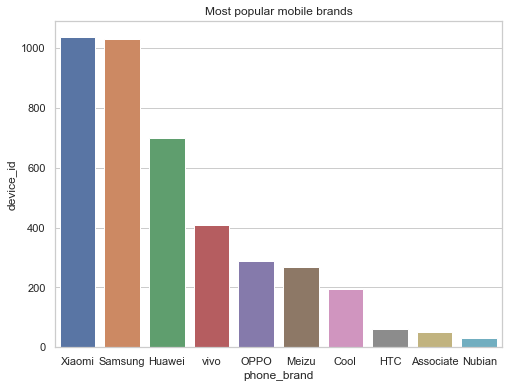

In [0]:
fig=plt.figure(figsize=(8,6))
sns.set(style="whitegrid")
sns.barplot(x='phone_brand',y='device_id',data=top_10_brands)
plt.title('Most popular mobile brands')
plt.show()

Xiaomi and Samsung are the most popular brands followed by Huawei and Vivo

In [0]:
top_10_models=df_phone_brand_device_model.groupby(['phone_brand', 'device_model'])['device_id'].count().nlargest(10)
top_10_models=top_10_models.reset_index()
top_10_models.head()

,phone_brand,device_model,device_id
0,Xiaomi,Red rice note,166
1,Xiaomi,MI 3,146
2,Samsung,Galaxy S4,133
3,Xiaomi,MI 2S,123
4,Samsung,Galaxy Note 3,120


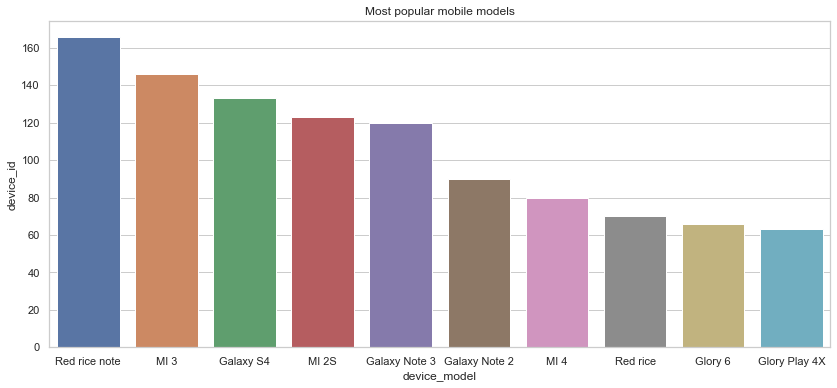

In [0]:
fig=plt.figure(figsize=(14,6))
sns.set(style="whitegrid")
sns.barplot(x='device_model',y='device_id',data=top_10_models)
plt.title('Most popular mobile models')
plt.show()

**Analysis of gender_age_train and phone_brand_device_model to determine the popular models across the age groups**

In [0]:
df_gender_age_train.head(3)

,device_id,gender,age,group age
0,2313145512701915151,M,34,32-38
1,-1539979963116391306,M,31,29-31
2,-7731743086143077949,M,35,32-38


In [0]:
df_phone_brand_device_model.head(3)

,device_id,phone_brand,device_model
0,2313145512701915151,vivo,Xplay
1,-1539979963116391306,Xiaomi,GN708W
2,-7731743086143077949,Xiaomi,Red rice


In [0]:
gender_age_phone_brand=pd.merge(left=df_gender_age_train, right=df_phone_brand_device_model, how='inner', left_on='device_id', right_on='device_id')
gender_age_phone_brand.head()

,device_id,gender,age,group age,phone_brand,device_model
0,2313145512701915151,M,34,32-38,vivo,Xplay
1,-1539979963116391306,M,31,29-31,Xiaomi,GN708W
2,-7731743086143077949,M,35,32-38,Xiaomi,Red rice
3,-4370696809239943432,M,36,32-38,Xiaomi,MI 2S
4,2959524852145775517,M,30,29-31,Samsung,A850


In [0]:
gender_age_phone_brand.head()

,device_id,gender,age,group age,phone_brand,device_model
0,2313145512701915151,M,34,32-38,vivo,Xplay
1,-1539979963116391306,M,31,29-31,Xiaomi,GN708W
2,-7731743086143077949,M,35,32-38,Xiaomi,Red rice
3,-4370696809239943432,M,36,32-38,Xiaomi,MI 2S
4,2959524852145775517,M,30,29-31,Samsung,A850


**Corrected the -ve device_id values**

In [0]:
gender_age_phone_brand[gender_age_phone_brand.device_id<0].count()

device_id       2222
gender          2222
age             2222
group age       2222
phone_brand     2222
device_model    2222
dtype: int64

In [0]:
gender_age_phone_brand.device_id=gender_age_phone_brand.device_id.abs()

In [0]:
gender_age_phone_brand[gender_age_phone_brand.device_id<0].count()

device_id       0
gender          0
age             0
group age       0
phone_brand     0
device_model    0
dtype: int64

**Determine the popular brands age wise for Male**

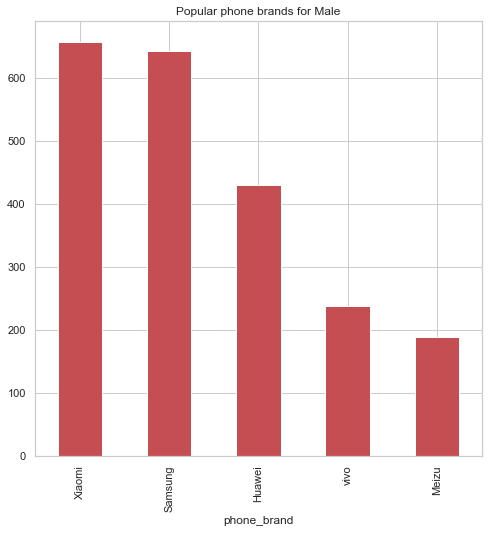

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M')].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male")
plt.show()

Xiaomi is most popular brand closely followed by Samsung, Huawei and Vivo are distant third and fourth.

So, majority of Male prefers Xiaomi and Samsung

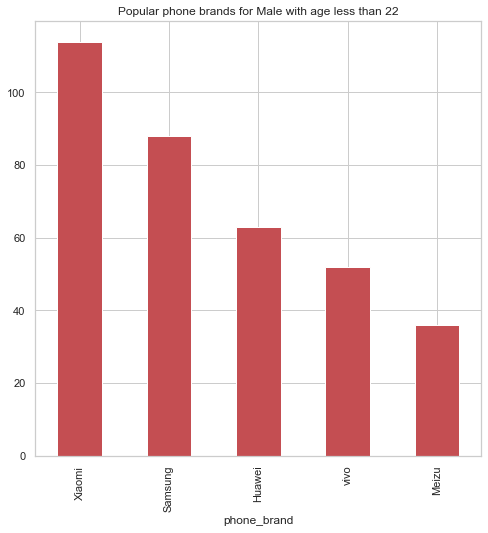

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M') & (gender_age_phone_brand.age<=22)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male with age less than 22")
plt.show()

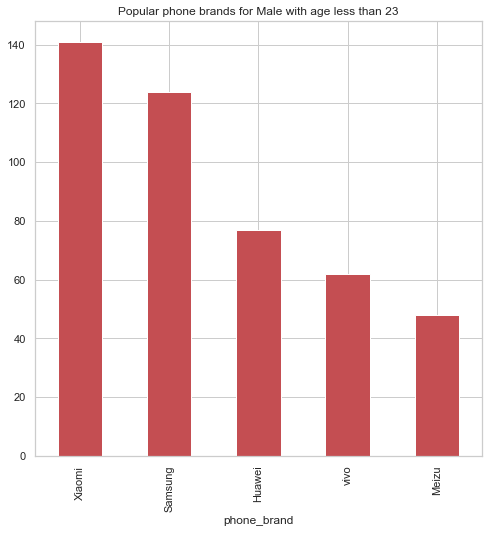

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M') & (gender_age_phone_brand.age<=23)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male with age less than 23")
plt.show()

Male with age till 23 prefers Xiaomi and then Samsung

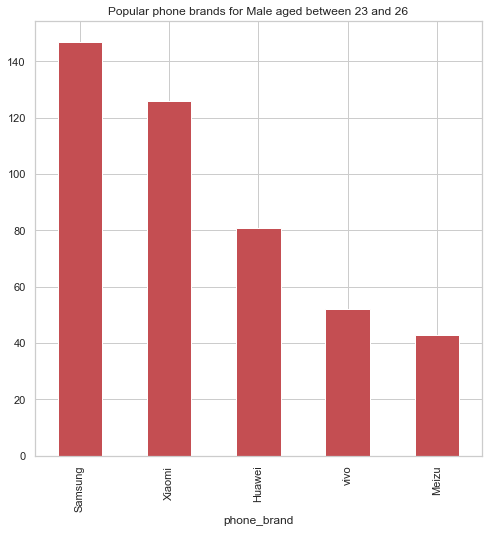

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M') & (gender_age_phone_brand.age>=23) & (gender_age_phone_brand.age<=26)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male aged between 23 and 26")
plt.show()

Male with age group 23-26 prefers Samsung over Xiaomi

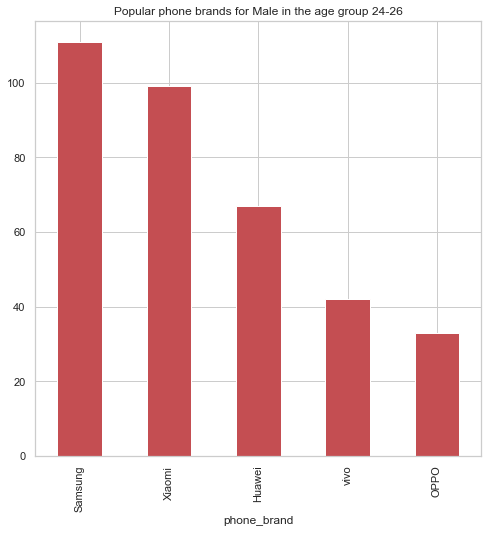

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M') & (gender_age_phone_brand.age>=24) & (gender_age_phone_brand.age<=26)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male in the age group 24-26")
plt.show()

Male with age group 24-26 prefers Samsung over Xiaomi

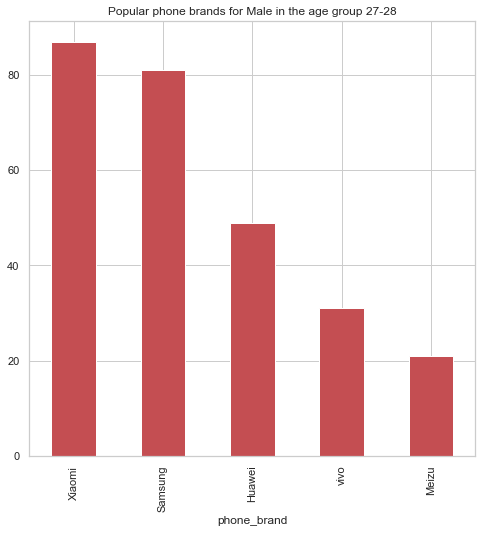

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M') & (gender_age_phone_brand.age>=27) & (gender_age_phone_brand.age<=28)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male in the age group 27-28")
plt.show()

Male in the age group 27-28 prefers Xiaomi

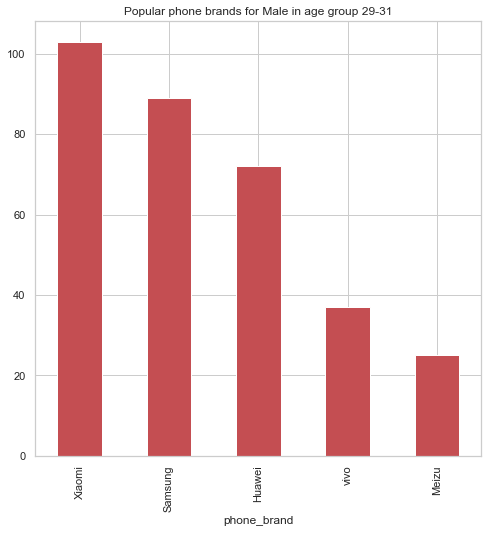

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M') & (gender_age_phone_brand.age>=29) & (gender_age_phone_brand.age<=31)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male in age group 29-31")
plt.show()

Male in the age group 29-31 prefers Xiaomi

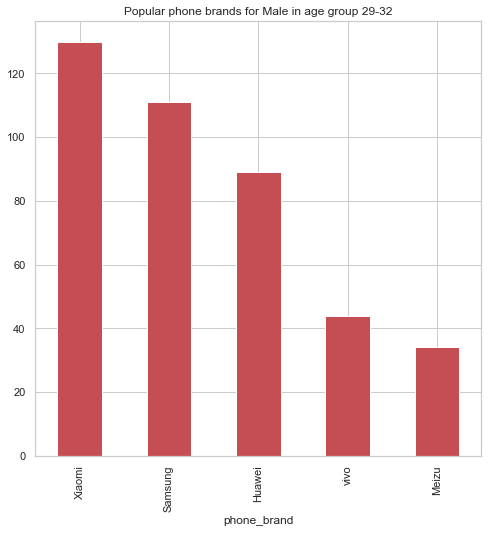

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M') & (gender_age_phone_brand.age>=29) & (gender_age_phone_brand.age<=32)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male in age group 29-32")
plt.show()

Male in the age group 29-32 prefers Xiaomi

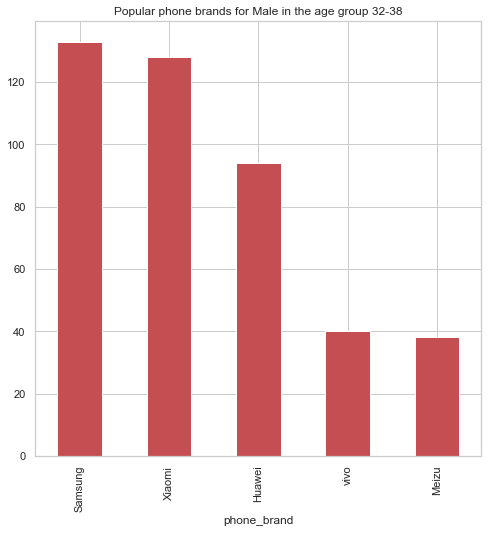

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M') & (gender_age_phone_brand.age>=32) & (gender_age_phone_brand.age<=38)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male in the age group 32-38")
plt.show()

Samsung is most preferred for the male in the age group 32-38

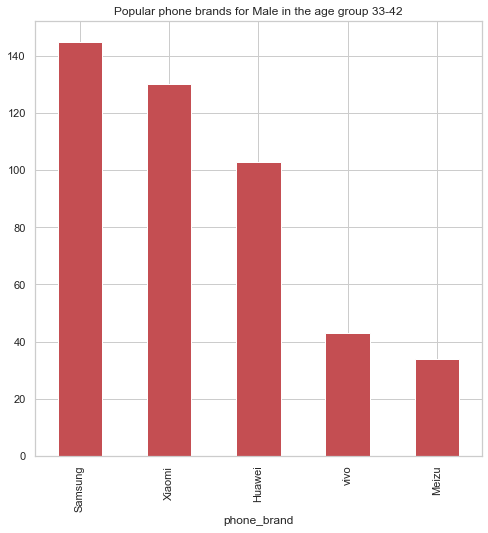

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M') & (gender_age_phone_brand.age>=33) & (gender_age_phone_brand.age<=42)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male in the age group 33-42")
plt.show()

Samsung is the most preferred for Male in age group 33-42

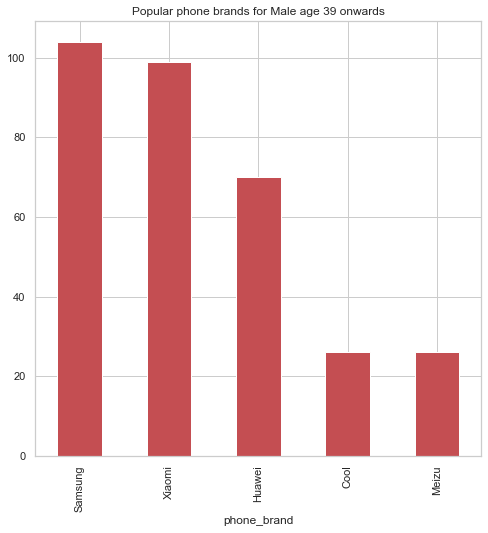

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M') & (gender_age_phone_brand.age>=39)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male age 39 onwards")
plt.show()

Samsung is most preferred closely followed by Xiaomi

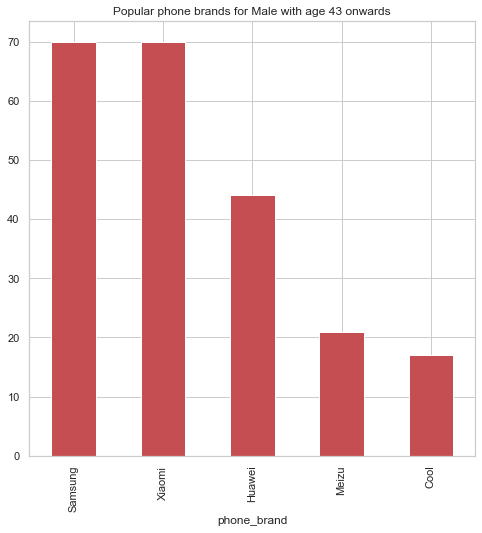

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='M') & (gender_age_phone_brand.age>=43)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='r')
plt.title("Popular phone brands for Male with age 43 onwards")
plt.show()

Samsung and Xiaomi are most preferred for age groups 43 onwards

For Male, Samsung and Xiaomi are the most preferred brands followed by Huawei

**Determine the popular brands age wise for Female**

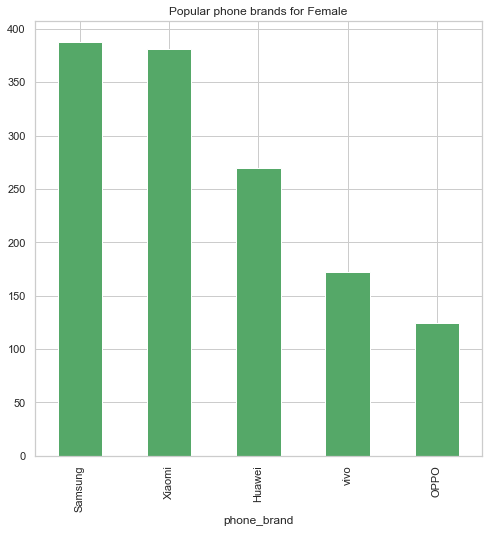

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F')].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female")
plt.show()

Samsung and closely Xiaomi are the most preferred

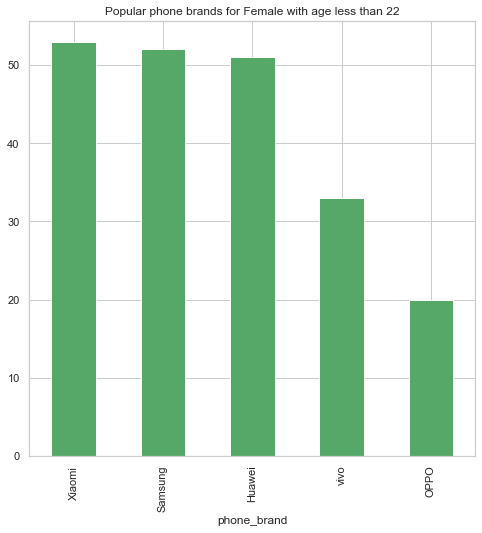

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F') & (gender_age_phone_brand.age<=22)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female with age less than 22")
plt.show()

Xiaomi and Samsung are the most preferred

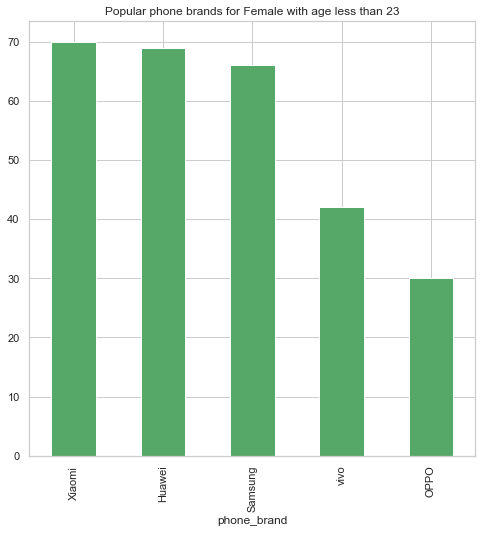

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F') & (gender_age_phone_brand.age<=23)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female with age less than 23")
plt.show()

For female with age 22-23 prefer Xiaomi and Huawei

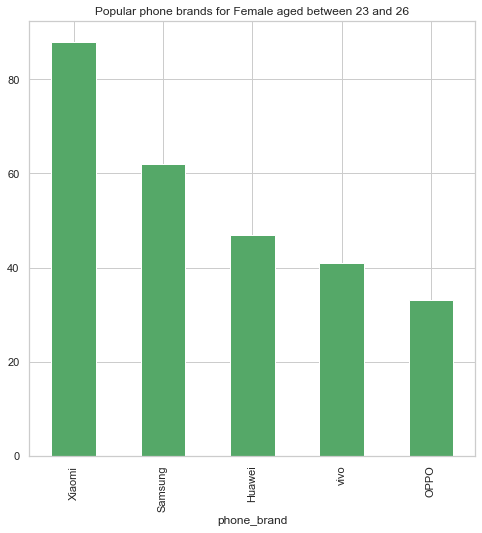

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F') & (gender_age_phone_brand.age>=23) & (gender_age_phone_brand.age<=26)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female aged between 23 and 26")
plt.show()

Xiaomi is most preferred for female in the age group 23-26

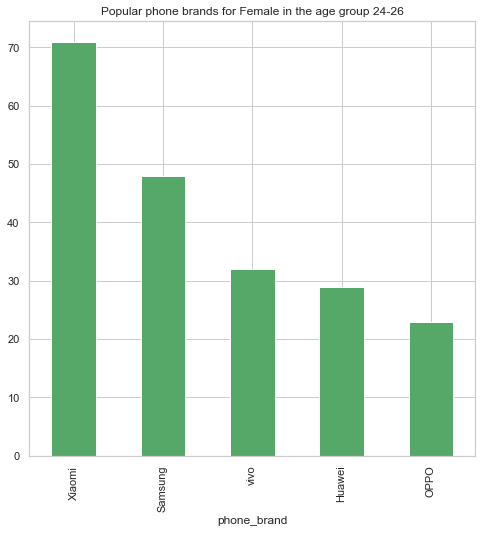

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F') & (gender_age_phone_brand.age>=24) & (gender_age_phone_brand.age<=26)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female in the age group 24-26")
plt.show()

Xiaomi is most preferred for female in the age group 23-26

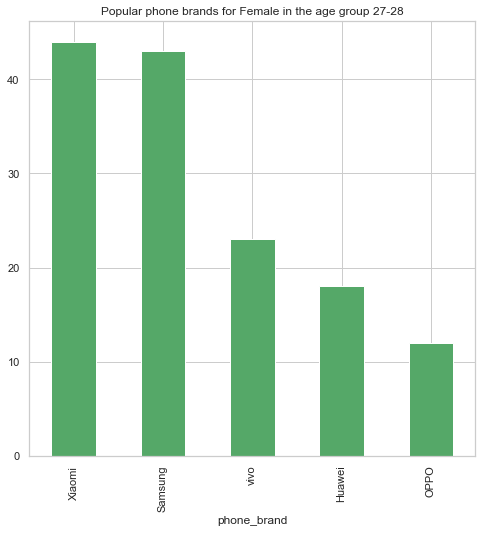

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F') & (gender_age_phone_brand.age>=27) & (gender_age_phone_brand.age<=28)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female in the age group 27-28")
plt.show()

Xiaomi and Samsung are preferred for age group  27-28 followed by Vivo

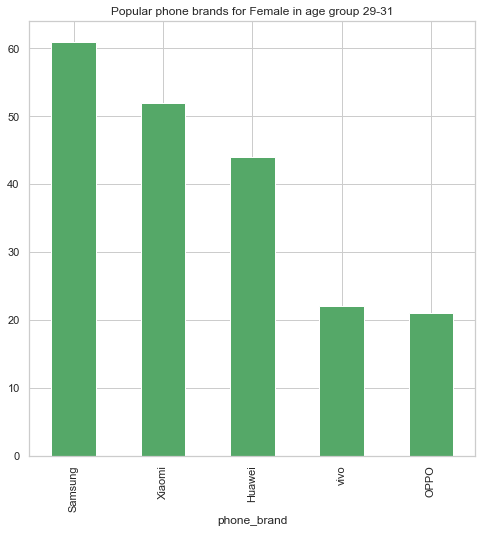

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F') & (gender_age_phone_brand.age>=29) & (gender_age_phone_brand.age<=31)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female in age group 29-31")
plt.show()

For the age group 29-31, Samsung is the preferred one followd by Xiaomi

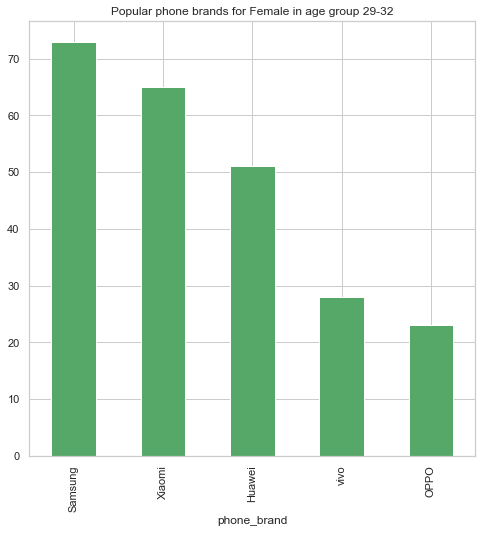

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F') & (gender_age_phone_brand.age>=29) & (gender_age_phone_brand.age<=32)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female in age group 29-32")
plt.show()

For the age group 29-32, Samsung is the preferred one followd by Xiaomi

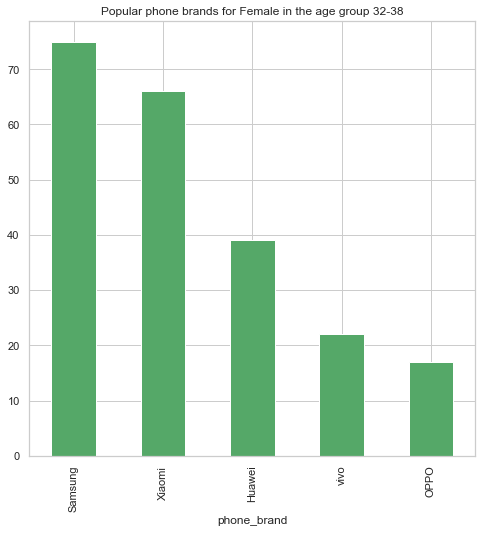

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F') & (gender_age_phone_brand.age>=32) & (gender_age_phone_brand.age<=38)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female in the age group 32-38")
plt.show()

For the age group 32-38, Samsung is the preferred one followd by Xiaomi

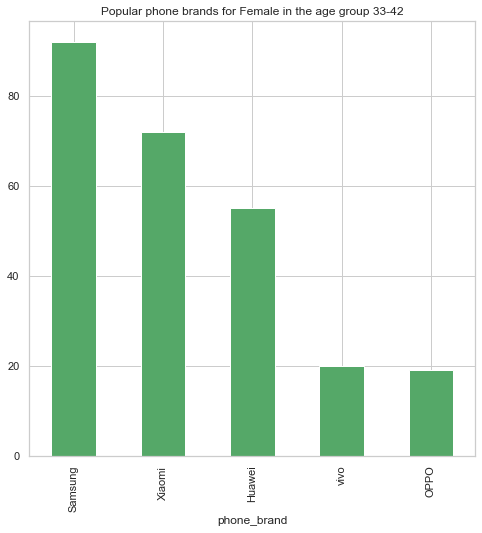

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F') & (gender_age_phone_brand.age>=33) & (gender_age_phone_brand.age<=42)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female in the age group 33-42")
plt.show()

For the age group 33-42, Samsung is the preferred one followd by Xiaomi

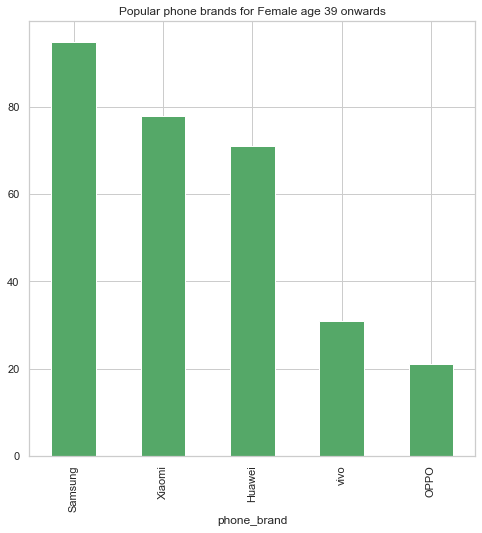

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F') & (gender_age_phone_brand.age>=39)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female age 39 onwards")
plt.show()

Samsung is the most preferred brand followed by Xiaomi

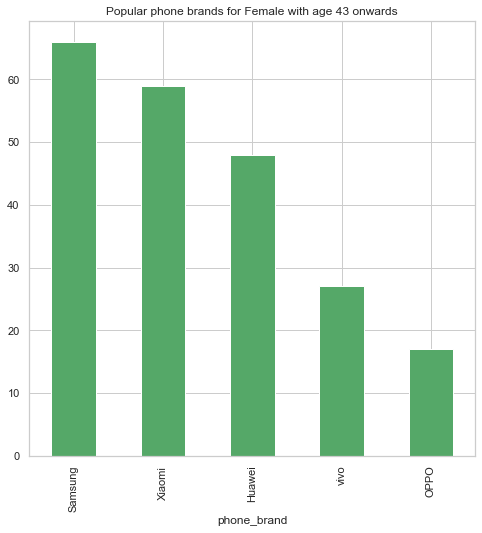

In [0]:
plt.figure(figsize=(8,8))
gender_age_phone_brand[(gender_age_phone_brand.gender=='F') & (gender_age_phone_brand.age>=43)].groupby(by='phone_brand')['phone_brand'].count().nlargest(5).plot(kind='bar', color='g')
plt.title("Popular phone brands for Female with age 43 onwards")
plt.show()

Samsung is the most followed brand 

For Male, overall order is  -  Xiaomi, Samsung and Huawei

For Female, overall order is - Samsung, Xiaomi and Huawei

Age-wise order is as below-

Age group|Male|Female|
--|--|--
<=22|Xiaomi, Samsung, Huawei|Xiaomi, Samsung, Huawei
<=23|Xiaomi, Samsung, Huawei|Xiaomi,  Huawei, Samsung
23-26|Samsung, Xiaomi, Huawei|Xiaomi, Samsung, Huawei
24-26|Samsung, Xiaomi, Huawei|Xiaomi, Samsung, Vivo
27-28|Xiaomi, Samsung, Huawei|Xiaomi, Samsung, Huawei
29-31|Xiaomi, Samsung, Huawei|Samsung, Xiaomi, Huawei	
29-32|Xiaomi, Samsung, Huawei|Samsung, Xiaomi, Huawei
32-28|Samsung, Xiaomi, Huawei|Samsung, Xiaomi, Huawei
33-42|Samsung, Xiaomi, Huawei|Samsung, Xiaomi, Huawei
>=39|Samsung, Xiaomi, Huawei|Samsung, Xiaomi, Huawei
>=43|Samsung, Xiaomi, Huawei|Samsung, Xiaomi, Huawei

**Checking for empty states based on cities for each states**

In [0]:
city_list=state_mp_list+state_cht_list+state_utr_list+state_jk_list+states_goa_list+states_ng_list
city_list

['Indore',
 'Raghogarh',
 'Sheopur',
 'Sidhi',
 'Sarni',
 'Betul',
 'Sehore',
 'Datia',
 'Dabra',
 'Guna',
 'Rewa',
 'Ratlam',
 'Bhind',
 'Itarsi',
 'Dhar',
 'Dewas',
 'Nagda',
 'Mandidip',
 'Damoh',
 'Murwara',
 'JabalpurCantonment',
 'Gwalior',
 'Tikamgarh',
 'Chhindwara',
 'Hoshangabad',
 'Shahdol',
 'Harda',
 'Jabalpur',
 'Shivapuri',
 'Nimach',
 'Shajapur',
 'Bhopal',
 'Sagar',
 'Morena',
 'Chhatarpur',
 'Ashoknagar',
 'Seoni',
 'Singrauli',
 'Balaghat',
 'Vidisha',
 'Jaora',
 'Mandsaur',
 'Khandwa',
 'Satna',
 'Burhanpur',
 'Basoda',
 'Khargone',
 'Sendhwa',
 'Gohad',
 'Ujjain',
 'Mau',
 'BinaEtawa',
 'Raipur',
 'Korba',
 'Raigarh',
 'Jagdalpur',
 'Bilaspur',
 'Bhilai',
 'Chirmiri',
 'Rajnandgaon',
 'Charoda',
 'Durg',
 'Ambikapur',
 'Dhamtari',
 'Pithoragarh',
 'Kashipur',
 'DehraDun',
 'Rurki',
 'DehraDunCantonment',
 'Haldwani',
 'Rishikesh',
 'Haridwar',
 'Anantnag',
 'Kathua',
 'Jammu',
 'Sopur',
 'Udhampur',
 'Baramula',
 'Srinagar',
 'Madgaon',
 'Mormugao',
 'Panaji',
 'Wo

In [0]:
sql_missing_state="select state, event_id, city from events_data where city in ({0})".format(city_list)
sql_missing_state=sql_missing_state.replace(']',' ')
sql_missing_state=sql_missing_state.replace('[',' ')
sql_missing_state

"select state, event_id, city from events_data where city in ( 'Indore', 'Raghogarh', 'Sheopur', 'Sidhi', 'Sarni', 'Betul', 'Sehore', 'Datia', 'Dabra', 'Guna', 'Rewa', 'Ratlam', 'Bhind', 'Itarsi', 'Dhar', 'Dewas', 'Nagda', 'Mandidip', 'Damoh', 'Murwara', 'JabalpurCantonment', 'Gwalior', 'Tikamgarh', 'Chhindwara', 'Hoshangabad', 'Shahdol', 'Harda', 'Jabalpur', 'Shivapuri', 'Nimach', 'Shajapur', 'Bhopal', 'Sagar', 'Morena', 'Chhatarpur', 'Ashoknagar', 'Seoni', 'Singrauli', 'Balaghat', 'Vidisha', 'Jaora', 'Mandsaur', 'Khandwa', 'Satna', 'Burhanpur', 'Basoda', 'Khargone', 'Sendhwa', 'Gohad', 'Ujjain', 'Mau', 'BinaEtawa', 'Raipur', 'Korba', 'Raigarh', 'Jagdalpur', 'Bilaspur', 'Bhilai', 'Chirmiri', 'Rajnandgaon', 'Charoda', 'Durg', 'Ambikapur', 'Dhamtari', 'Pithoragarh', 'Kashipur', 'DehraDun', 'Rurki', 'DehraDunCantonment', 'Haldwani', 'Rishikesh', 'Haridwar', 'Anantnag', 'Kathua', 'Jammu', 'Sopur', 'Udhampur', 'Baramula', 'Srinagar', 'Madgaon', 'Mormugao', 'Panaji', 'Wokha', 'Dimapur', 'Ko

In [0]:
missing_state_df=get_data(sql_missing_state)
missing_state_df.head()

Connected to MySQL Server version 5.6.46-cll-lve
MySQL connection is closed


,state,event_id,city
0,MadhyaPradesh,10117,Indore
1,MadhyaPradesh,112369,Indore
2,MadhyaPradesh,139098,Indore
3,MadhyaPradesh,190983,Indore
4,MadhyaPradesh,249507,Indore


In [0]:
missing_state_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 262462 entries, 0 to 262461
Data columns (total 3 columns):
state       262462 non-null object
event_id    262462 non-null int64
city        262462 non-null object
dtypes: int64(1), object(2)
memory usage: 6.0+ MB


No empty values for State found for given cities

In [0]:
**Adding events_data dataset to above dataset to determine the age and popular brands associated with top events registered for each state**

**Madhya Pradesh**

In [0]:
gender_age_phone_brand.head()

,device_id,gender,age,group age,phone_brand,device_model
0,2313145512701915151,M,34,32-38,vivo,Xplay
1,1539979963116391306,M,31,29-31,Xiaomi,GN708W
2,7731743086143077949,M,35,32-38,Xiaomi,Red rice
3,4370696809239943432,M,36,32-38,Xiaomi,MI 2S
4,2959524852145775517,M,30,29-31,Samsung,A850


In [0]:
df_events_mp.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
0,10117,5323073305882503557,2016-05-01 11:11:24,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,11:11:24
1,112369,5323073305882503557,2016-05-04 22:47:19,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-04,22:47:19
2,139098,5323073305882503557,2016-05-01 09:55:58,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,09:55:58
3,190983,5323073305882503557,2016-05-04 22:51:03,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-04,22:51:03
4,249507,5323073305882503557,2016-05-01 11:24:12,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,11:24:12


In [0]:
tmp_mp_df=pd.merge(left=df_events_mp, right=gender_age_phone_brand, left_on='device_id', right_on='device_id', how='inner')
#tmp_mp_df.head()

In [0]:
tmp_df=tmp_mp_df[(tmp_mp_df.city=='Indore')]
#tmp_df.head()

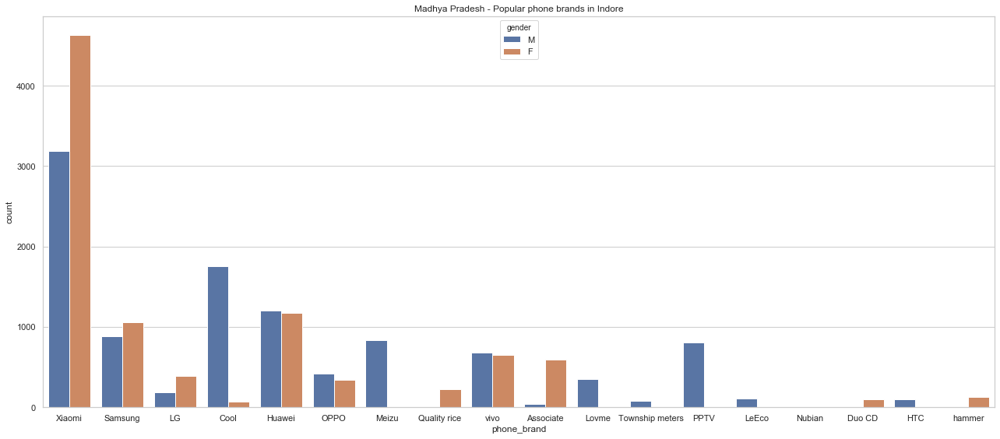

In [0]:
plt.figure(figsize=(18,8))
ax = sns.countplot(x="phone_brand", hue="gender", data=tmp_df[0:20000])
plt.title('Madhya Pradesh - Popular phone brands in Indore')
plt.tight_layout()

 - In Indore, Xiaomi and CoolPad are the most popular brands followed by Huawei,Meizu and Samsung.

- Female prefer Xiaomi more than Male, but overall Xiaomi is preferred than Samsung.

 - CoolPad is common with Male and Huawei is popular with both Male and Female

In [0]:
tmp_df=tmp_mp_df[(tmp_mp_df.city!='Indore')]
tmp_df.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group age,phone_brand,device_model
189207,20870,1009630515742770146,2016-05-06 17:59:28,77.275932,24.537928,Raghogarh,MadhyaPradesh,2016-05-06,17:59:28,M,20,22-,Xiaomi,Red rice 2A
189208,496700,1009630515742770146,2016-05-02 07:12:16,77.275932,24.537928,Raghogarh,MadhyaPradesh,2016-05-02,07:12:16,M,20,22-,Xiaomi,Red rice 2A
189209,1018382,1009630515742770146,2016-05-06 17:32:53,77.275932,24.537928,Raghogarh,MadhyaPradesh,2016-05-06,17:32:53,M,20,22-,Xiaomi,Red rice 2A
189210,1206110,1009630515742770146,2016-05-06 15:02:21,77.275932,24.537928,Raghogarh,MadhyaPradesh,2016-05-06,15:02:21,M,20,22-,Xiaomi,Red rice 2A
189211,1245151,1009630515742770146,2016-05-02 08:50:26,77.275932,24.537928,Raghogarh,MadhyaPradesh,2016-05-02,08:50:26,M,20,22-,Xiaomi,Red rice 2A


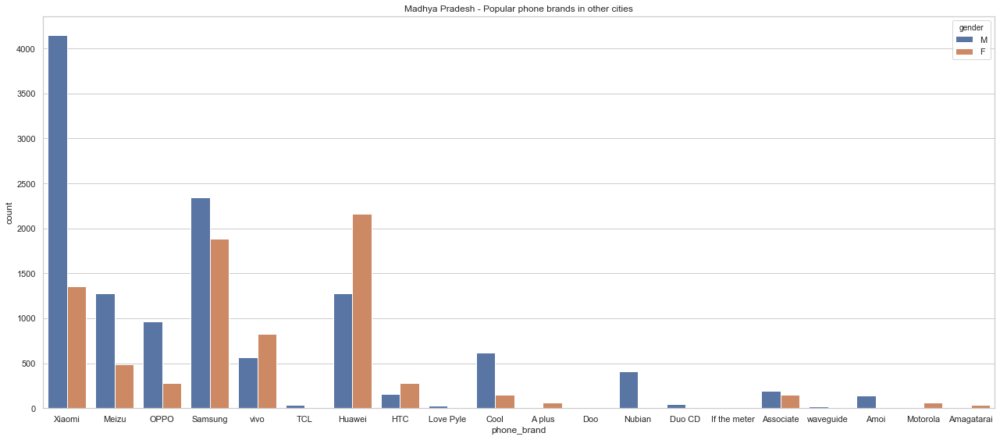

In [0]:
plt.figure(figsize=(18,8))
ax = sns.countplot(x="phone_brand", hue="gender", data=tmp_df[0:20000])
plt.title('Madhya Pradesh - Popular phone brands in other cities')
plt.tight_layout()

 - In other cities, Xiaomi is the best seller, followed by Samsung and Huawei.
 - Male prefer Xiaomi and Samsung while Female more inclined towards Samsung and Huawei
 - Huawei more popular with Female as compared to Male

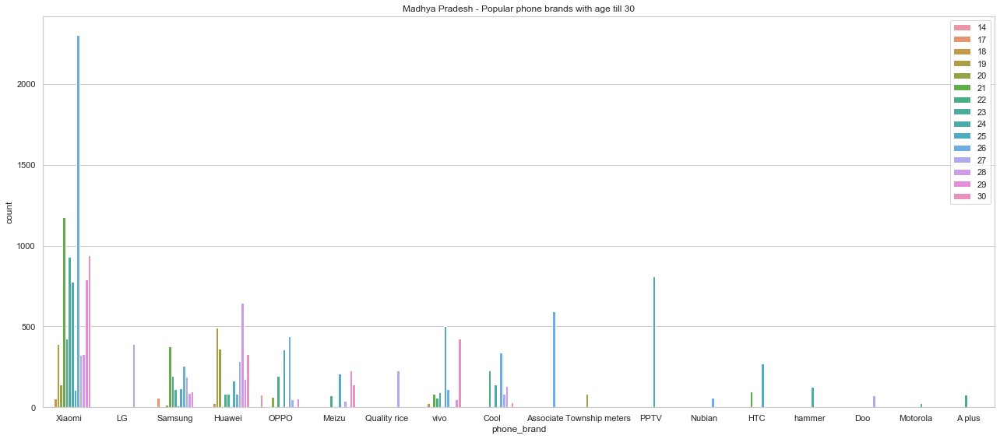

In [0]:
tmp_df=tmp_mp_df.loc[tmp_mp_df.age<=30,['age','phone_brand','city']]
#tmp_df.head()
plt.figure(figsize=(18,8))
g = sns.countplot(x="phone_brand", hue="age", data=tmp_df[0:20000])
plt.title('Madhya Pradesh - Popular phone brands with age till 30')
g.legend(loc='upper right')
plt.tight_layout()

 - Customers with age group 14-30 prefers Xiaomi more than any other brand, most of the cusotmers in this age group are in range 21-25, they may be more inclined towards Xiaomi as cheaper and good quality as compared to other brands which could be either costly like Samsung and Huawei.

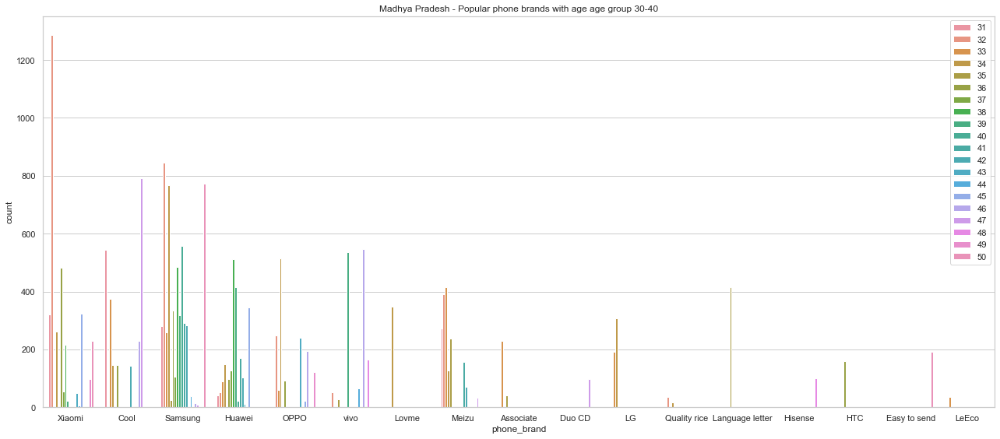

In [0]:
tmp_df=tmp_mp_df.loc[(tmp_mp_df.age>30) & (tmp_mp_df.age<=50),['age','phone_brand','city']]
#tmp_df.head()
plt.figure(figsize=(18,8))
g = sns.countplot(x="phone_brand", hue="age", data=tmp_df[0:20000])
plt.title('Madhya Pradesh - Popular phone brands with age age group 30-40')
g.legend(loc='upper right')
plt.tight_layout()

 - Customers in the age group 30-50, prefers Xiaomi and Samsung more than any other brand

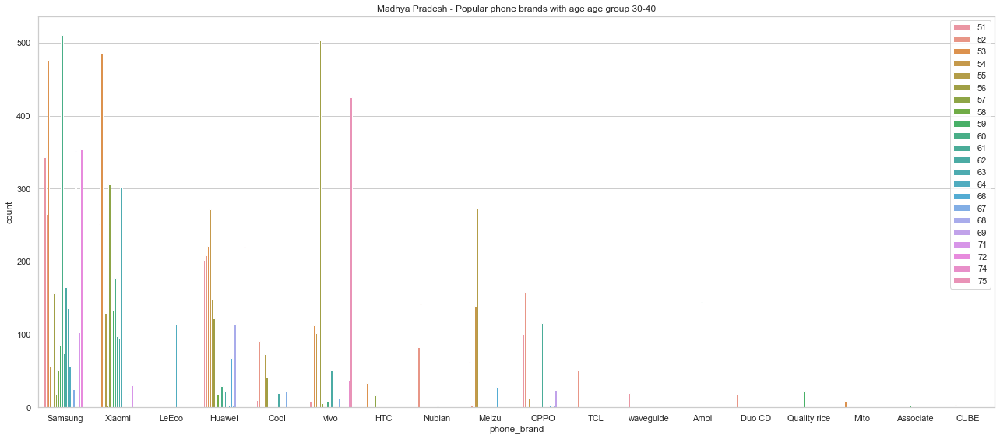

In [0]:
tmp_df=tmp_mp_df.loc[(tmp_mp_df.age>50),['age','phone_brand','city']]
#tmp_df.head()
plt.figure(figsize=(18,8))
g = sns.countplot(x="phone_brand", hue="age", data=tmp_df[0:20000])
plt.title('Madhya Pradesh - Popular phone brands with age age group 30-40')
g.legend(loc='upper right')
plt.tight_layout()

 - Customers with age >50, prefers Samsung and Xiaomi, then Huwaei

**Chattisgarh**

In [0]:
tmp_df=pd.merge(left=df_events_cht, right=gender_age_phone_brand, left_on='device_id', right_on='device_id', how='inner')
tmp_df.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group age,phone_brand,device_model
0,21994,3170675365100452735,2016-05-04 19:44:31,81.647987,21.284864,Raipur,Chhattisgarh,2016-05-04,19:44:31,F,30,29-32,OPPO,Rdahh
1,60725,3170675365100452735,2016-05-02 22:02:20,81.647987,21.284864,Raipur,Chhattisgarh,2016-05-02,22:02:20,F,30,29-32,OPPO,Rdahh
2,64448,3170675365100452735,2016-05-05 01:08:34,81.647987,21.284864,Raipur,Chhattisgarh,2016-05-05,01:08:34,F,30,29-32,OPPO,Rdahh
3,65830,3170675365100452735,2016-05-04 00:50:31,81.647987,21.284864,Raipur,Chhattisgarh,2016-05-04,00:50:31,F,30,29-32,OPPO,Rdahh
4,70306,3170675365100452735,2016-05-07 00:33:50,81.647987,21.284864,Raipur,Chhattisgarh,2016-05-07,00:33:50,F,30,29-32,OPPO,Rdahh


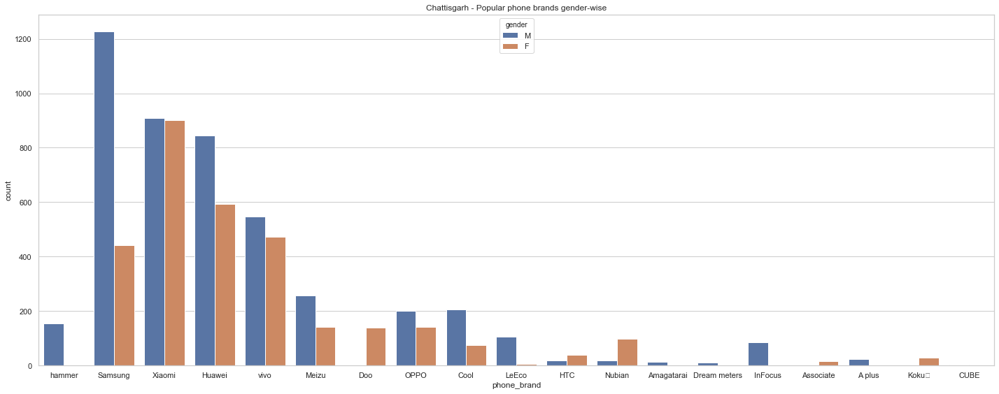

In [0]:
plt.figure(figsize=(20,8))
ax = sns.countplot(x="phone_brand", hue="gender", data=tmp_df[0:20000])
plt.title('Chattisgarh - Popular phone brands gender-wise')
plt.tight_layout()

 - Male prefer Samsung more than Female
 - Xiaomi popular with both
 - Huawei and Vivo have more Female customers than Samsung

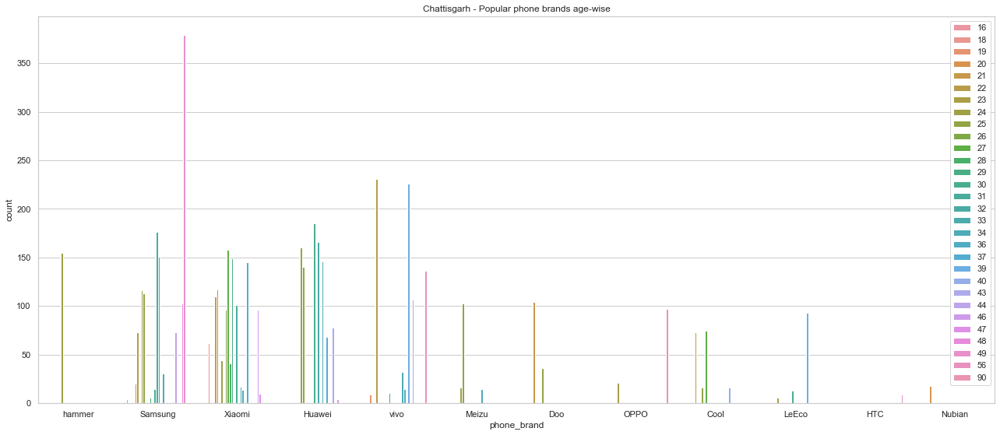

In [0]:
plt.figure(figsize=(18,8))
g = sns.countplot(x="phone_brand", hue="age", data=tmp_df[0:5000])
plt.title('Chattisgarh - Popular phone brands age-wise')
g.legend(loc='upper right')
plt.tight_layout()

 - Customer with age group till 25 prefers Xiaomi and Huawei
 - Customer with age group 25-45, prefers Huawei,Xiaomi and Samsung in the order
 - Customers with age group  >40 mostly prefers Samsung and Vivo

**Uttrakhand**

In [0]:
tmp_df=pd.merge(left=df_events_utr, right=gender_age_phone_brand, left_on='device_id', right_on='device_id', how='inner')
tmp_df.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group age,phone_brand,device_model
0,21134,3256357565700008048,2016-05-07 18:39:49,80.266388,29.64415,Pithoragarh,Uttaranchal,2016-05-07,18:39:49,M,24,23-26,hammer,T1
1,66274,3256357565700008048,2016-05-07 00:14:05,80.266388,29.64415,Pithoragarh,Uttaranchal,2016-05-07,00:14:05,M,24,23-26,hammer,T1
2,89957,3256357565700008048,2016-05-02 10:35:29,80.266388,29.64415,Pithoragarh,Uttaranchal,2016-05-02,10:35:29,M,24,23-26,hammer,T1
3,104129,3256357565700008048,2016-05-06 15:38:15,80.266388,29.64415,Pithoragarh,Uttaranchal,2016-05-06,15:38:15,M,24,23-26,hammer,T1
4,165628,3256357565700008048,2016-05-06 06:17:42,80.266388,29.64415,Pithoragarh,Uttaranchal,2016-05-06,06:17:42,M,24,23-26,hammer,T1


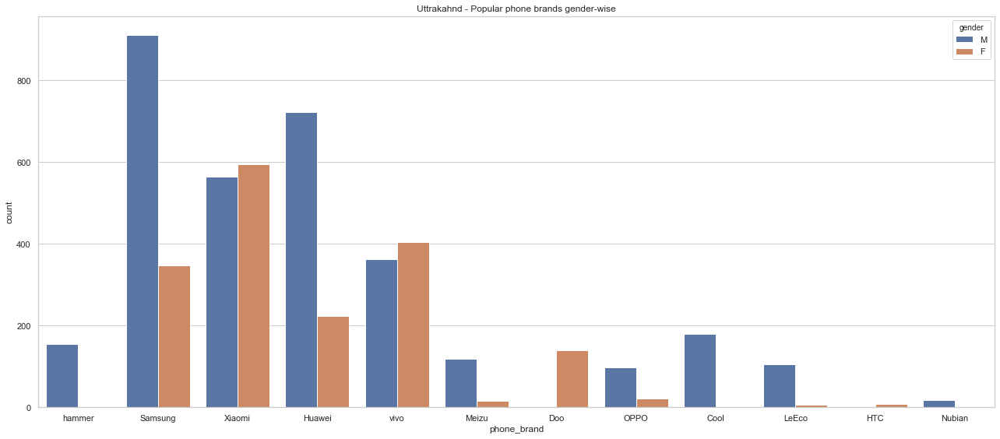

In [0]:
plt.figure(figsize=(18,8))
ax = sns.countplot(x="phone_brand", hue="gender", data=tmp_df[0:5000])
plt.title('Uttrakahnd - Popular phone brands gender-wise')
plt.tight_layout()

 - Samsung and Huawei are more populate with Male, with Xiaomi closely next
 - Female prefers Xiaomi followed by Samsung and Vivo

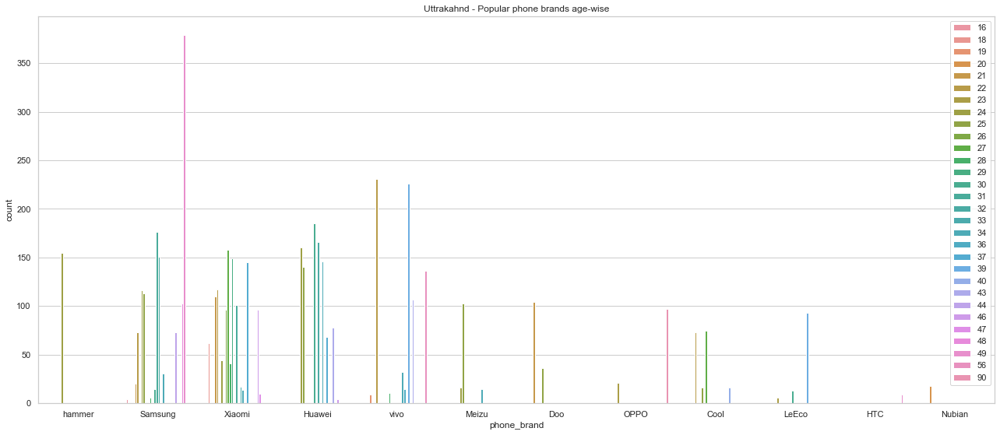

In [0]:
plt.figure(figsize=(18,8))
g = sns.countplot(x="phone_brand", hue="age", data=tmp_df[0:5000])
plt.title('Uttrakahnd - Popular phone brands age-wise')
g.legend(loc='upper right')
plt.tight_layout()

 - Customer with age group till 25 prefers Xiaomi and Huawei
 - Customer with age group 25-45, prefers Huawei,Xiaomi and Samsung in the order
 - Customers with age group  >40 mostly prefers Samsung and Vivo

**Jammu and Kashmir**

In [0]:
tmp_df=pd.merge(left=df_events_jk, right=gender_age_phone_brand, left_on='device_id', right_on='device_id', how='inner')
tmp_df.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group age,phone_brand,device_model
0,21771,345465158970686742,2016-05-03 19:35:53,75.242622,33.808079,Anantnag,JammuandKashmir,2016-05-03,19:35:53,M,29,29-31,Xiaomi,Red rice note enhanced version
1,23486,345465158970686742,2016-05-03 20:04:00,75.242622,33.808079,Anantnag,JammuandKashmir,2016-05-03,20:04:00,M,29,29-31,Xiaomi,Red rice note enhanced version
2,23739,345465158970686742,2016-05-04 20:36:53,75.242622,33.808079,Anantnag,JammuandKashmir,2016-05-04,20:36:53,M,29,29-31,Xiaomi,Red rice note enhanced version
3,23740,345465158970686742,2016-05-04 20:47:17,75.242622,33.808079,Anantnag,JammuandKashmir,2016-05-04,20:47:17,M,29,29-31,Xiaomi,Red rice note enhanced version
4,44968,345465158970686742,2016-05-02 13:55:56,75.242622,33.808079,Anantnag,JammuandKashmir,2016-05-02,13:55:56,M,29,29-31,Xiaomi,Red rice note enhanced version


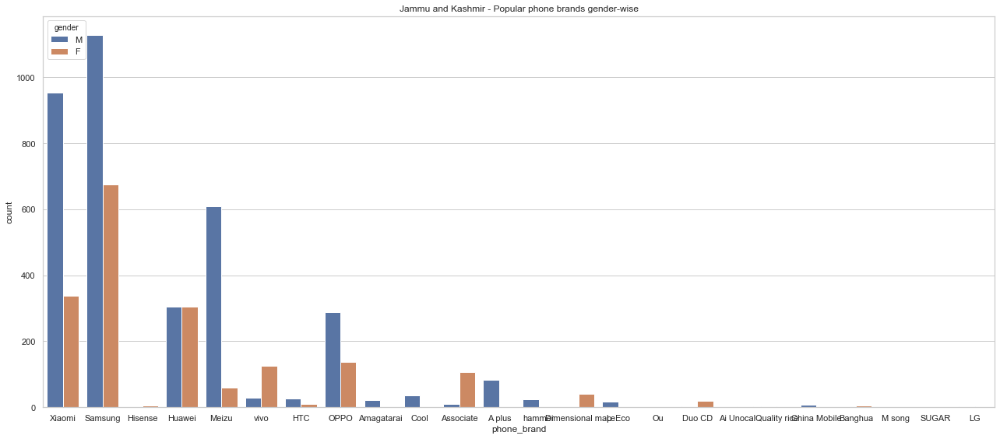

In [0]:
plt.figure(figsize=(18,8))
ax = sns.countplot(x="phone_brand", hue="gender", data=tmp_df[0:20000])
plt.title('Jammu and Kashmir - Popular phone brands gender-wise')
plt.tight_layout()

 - Samsung and Xiaomi are more popular with Male followed by Meizu and Oppo and Huawei
 - Female prefers Samsung then  Xiaomi and Huawei

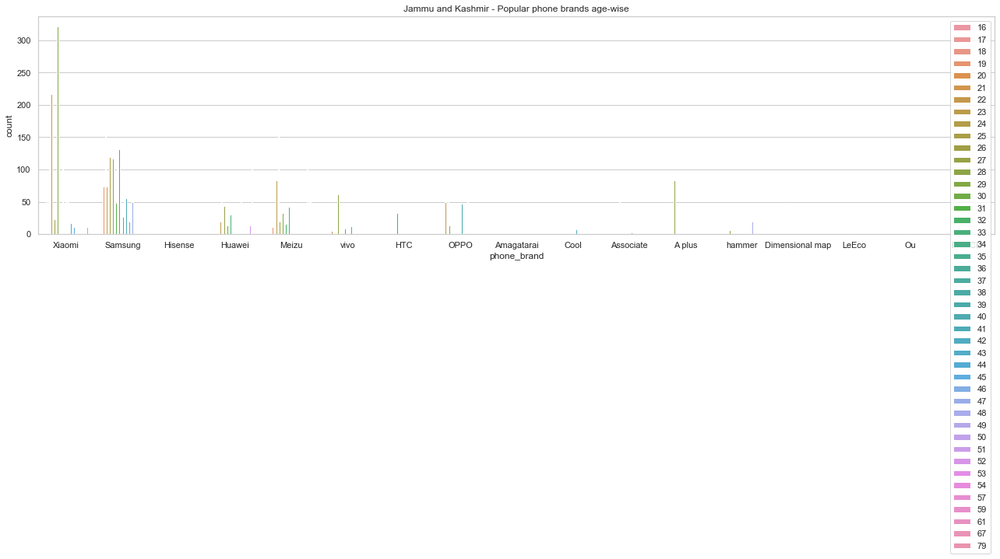

In [0]:
plt.figure(figsize=(18,8))
g = sns.countplot(x="phone_brand", hue="age", data=tmp_df[0:5000])
plt.title('Jammu and Kashmir - Popular phone brands age-wise')
g.legend(loc='upper right')
plt.tight_layout()

Xiaomi and Samsung are the most preferred ones across the age group

**Goa**

In [0]:
tmp_df=pd.merge(left=df_events_goa, right=gender_age_phone_brand, left_on='device_id', right_on='device_id', how='inner')
tmp_df.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group age,phone_brand,device_model
0,20984,6751207669980900563,2016-05-06 18:23:03,73.973602,15.317287,Madgaon,Goa,2016-05-06,18:23:03,F,25,24-26,Samsung,Galaxy S4
1,33979,6751207669980900563,2016-05-04 06:02:36,73.973602,15.317287,Madgaon,Goa,2016-05-04,06:02:36,F,25,24-26,Samsung,Galaxy S4
2,104768,6751207669980900563,2016-05-07 15:11:31,73.973602,15.317287,Madgaon,Goa,2016-05-07,15:11:31,F,25,24-26,Samsung,Galaxy S4
3,135615,6751207669980900563,2016-05-07 15:10:31,73.973602,15.317287,Madgaon,Goa,2016-05-07,15:10:31,F,25,24-26,Samsung,Galaxy S4
4,420749,6751207669980900563,2016-05-07 15:12:39,73.973602,15.317287,Madgaon,Goa,2016-05-07,15:12:39,F,25,24-26,Samsung,Galaxy S4


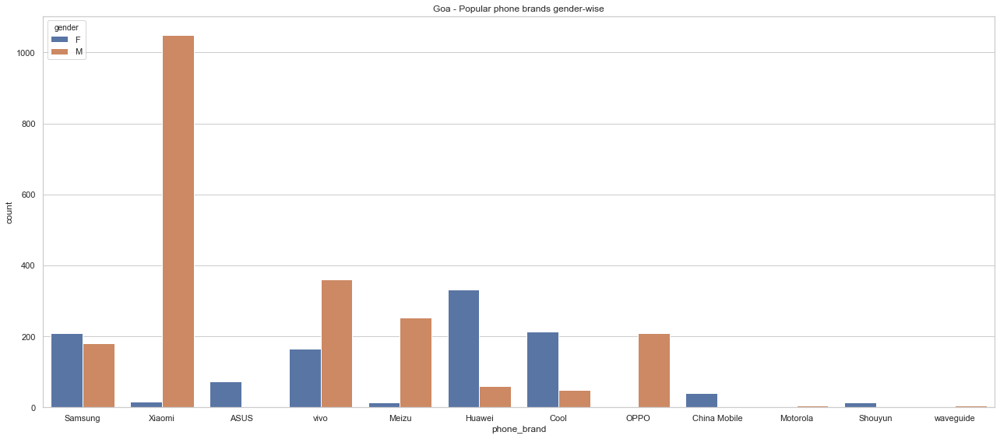

In [0]:
plt.figure(figsize=(18,8))
ax = sns.countplot(x="phone_brand", hue="gender", data=tmp_df[0:20000])
plt.title('Goa - Popular phone brands gender-wise')
plt.tight_layout()

-  Female prefer Xiaomi and then Vivo 
-  Male prefer Huawei, CoolPad and Samsung

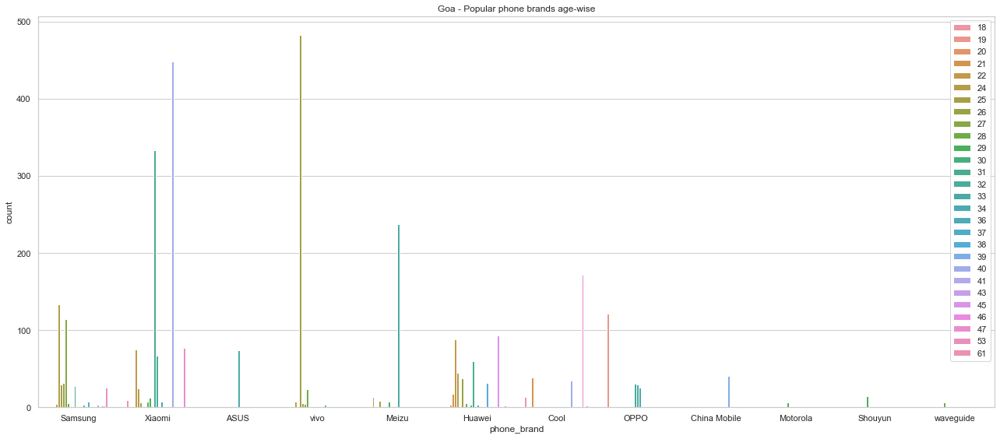

In [0]:
plt.figure(figsize=(18,8))
g = sns.countplot(x="phone_brand", hue="age", data=tmp_df[0:5000])
plt.title('Goa - Popular phone brands age-wise')
g.legend(loc='upper right')
plt.tight_layout()

 - Customers with age group till 25 prefers Vivo and Samsung
 - Other age group prefers Xiaomi and Meizu

**Nagaland**

In [0]:
tmp_df=pd.merge(left=df_events_nag, right=gender_age_phone_brand, left_on='device_id', right_on='device_id', how='inner')
tmp_df.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group age,phone_brand,device_model
0,22093,9132041579920627992,2016-05-04 19:03:15,94.354393,26.183962,Wokha,Nagaland,2016-05-04,19:03:15,M,25,23-26,Samsung,Galaxy S4
1,22794,9132041579920627992,2016-05-07 19:37:42,94.354393,26.183962,Wokha,Nagaland,2016-05-07,19:37:42,M,25,23-26,Samsung,Galaxy S4
2,55519,9132041579920627992,2016-05-05 19:22:27,94.354393,26.183962,Wokha,Nagaland,2016-05-05,19:22:27,M,25,23-26,Samsung,Galaxy S4
3,55692,9132041579920627992,2016-05-05 19:17:15,94.354393,26.183962,Wokha,Nagaland,2016-05-05,19:17:15,M,25,23-26,Samsung,Galaxy S4
4,102376,9132041579920627992,2016-05-04 19:01:14,94.354393,26.183962,Wokha,Nagaland,2016-05-04,19:01:14,M,25,23-26,Samsung,Galaxy S4


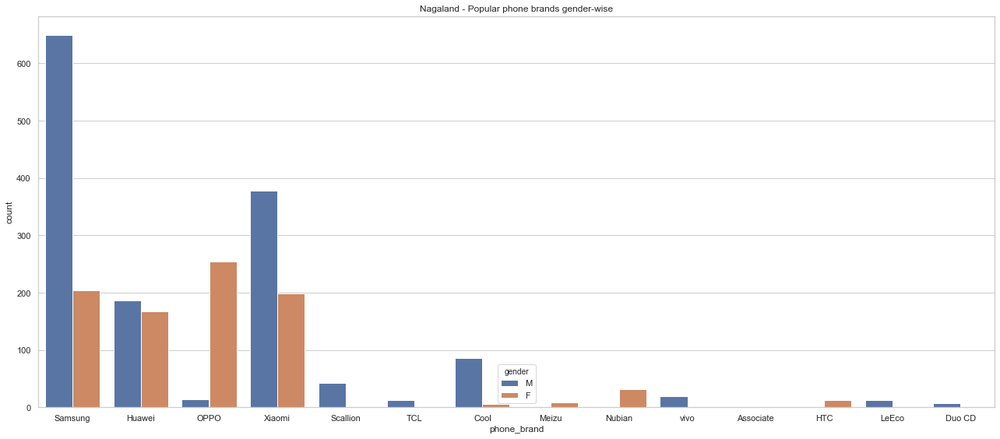

In [0]:
plt.figure(figsize=(18,8))
ax = sns.countplot(x="phone_brand", hue="gender", data=tmp_df[0:20000])
plt.title('Nagaland - Popular phone brands gender-wise')
plt.tight_layout()

 - Male prefer Samsung and Xiaomi and Huawei
 - Female prefer Oppo followed by Samsung, Xiaomi and  Huawei

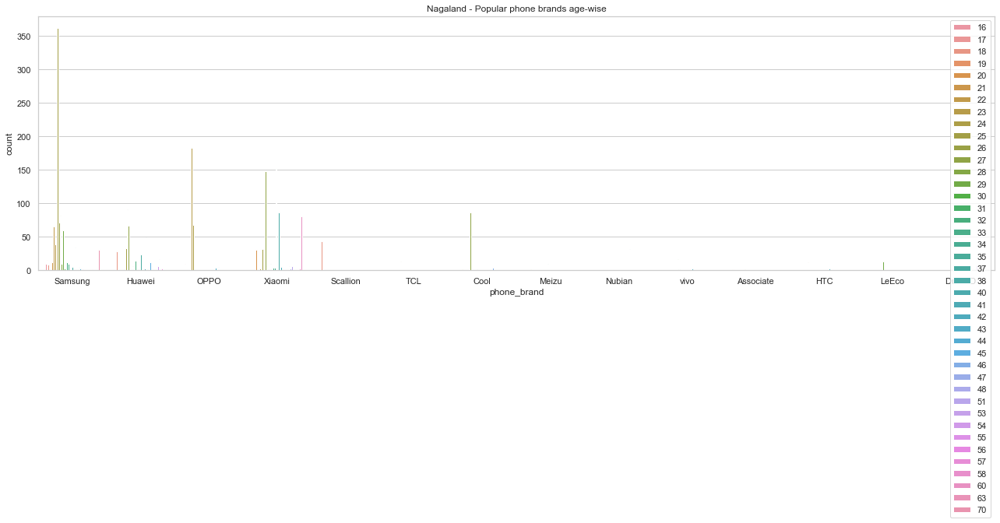

In [0]:
plt.figure(figsize=(18,8))
g = sns.countplot(x="phone_brand", hue="age", data=tmp_df[0:5000])
plt.title('Nagaland - Popular phone brands age-wise')
g.legend(loc='upper right')
plt.tight_layout()

 - Customer with age group till 25 prefers Samsung, Oppo and Xiaomi
 - Other age group prefers Samsung

**Preparing Final dataset**

In [0]:
gender_age_phone_brand.head()

,device_id,gender,age,group age,phone_brand,device_model
0,2313145512701915151,M,34,32-38,vivo,Xplay
1,1539979963116391306,M,31,29-31,Xiaomi,GN708W
2,7731743086143077949,M,35,32-38,Xiaomi,Red rice
3,4370696809239943432,M,36,32-38,Xiaomi,MI 2S
4,2959524852145775517,M,30,29-31,Samsung,A850


In [0]:
df_event_data.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
0,10117,5323073305882503557,2016-05-01 11:11:24,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,11:11:24
1,112369,5323073305882503557,2016-05-04 22:47:19,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-04,22:47:19
2,139098,5323073305882503557,2016-05-01 09:55:58,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,09:55:58
3,190983,5323073305882503557,2016-05-04 22:51:03,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-04,22:51:03
4,249507,5323073305882503557,2016-05-01 11:24:12,75.939545,22.769171,Indore,MadhyaPradesh,2016-05-01,11:24:12


In [0]:
combined_df=pd.merge(left=gender_age_phone_brand, right=df_event_data, how='inner', left_on='device_id', right_on='device_id')
combined_df.head()

,device_id,gender,age,group age,phone_brand,device_model,event_id,timestamp,longitude,latitude,city,state,Date,Time
0,2313145512701915151,M,34,32-38,vivo,Xplay,143656,2016-05-02 20:48:49,81.374336,24.540928,Rewa,MadhyaPradesh,2016-05-02,20:48:49
1,2313145512701915151,M,34,32-38,vivo,Xplay,679264,2016-05-04 14:16:49,81.374336,24.540928,Rewa,MadhyaPradesh,2016-05-04,14:16:49
2,2313145512701915151,M,34,32-38,vivo,Xplay,1396530,2016-05-02 20:52:01,81.374336,24.540928,Rewa,MadhyaPradesh,2016-05-02,20:52:01
3,2313145512701915151,M,34,32-38,vivo,Xplay,1719202,2016-05-04 14:14:15,81.374336,24.540928,Rewa,MadhyaPradesh,2016-05-04,14:14:15
4,1539979963116391306,M,31,29-31,Xiaomi,GN708W,2755188,2016-05-02 16:41:31,75.106987,24.156200,Mandsaur,MadhyaPradesh,2016-05-02,16:41:31


In [0]:
combined_df.drop(['gender','age','group age','phone_brand','device_model','city','Date','Time'], axis=1, inplace=True)
combined_df.head()

,device_id,event_id,timestamp,longitude,latitude,state
0,2313145512701915151,143656,2016-05-02 20:48:49,81.374336,24.540928,MadhyaPradesh
1,2313145512701915151,679264,2016-05-04 14:16:49,81.374336,24.540928,MadhyaPradesh
2,2313145512701915151,1396530,2016-05-02 20:52:01,81.374336,24.540928,MadhyaPradesh
3,2313145512701915151,1719202,2016-05-04 14:14:15,81.374336,24.540928,MadhyaPradesh
4,1539979963116391306,2755188,2016-05-02 16:41:31,75.106987,24.156200,MadhyaPradesh


In [0]:
combined_df.shape

(261097, 6)

In [0]:
combined_df=combined_df[['event_id','device_id','timestamp','longitude','latitude','state']]
combined_df.shape

(261097, 6)

In [0]:
combined_df.head()

,event_id,device_id,timestamp,longitude,latitude,state
0,143656,2313145512701915151,2016-05-02 20:48:49,81.374336,24.540928,MadhyaPradesh
1,679264,2313145512701915151,2016-05-04 14:16:49,81.374336,24.540928,MadhyaPradesh
2,1396530,2313145512701915151,2016-05-02 20:52:01,81.374336,24.540928,MadhyaPradesh
3,1719202,2313145512701915151,2016-05-04 14:14:15,81.374336,24.540928,MadhyaPradesh
4,2755188,1539979963116391306,2016-05-02 16:41:31,75.106987,24.156200,MadhyaPradesh


In [0]:
combined_df.to_csv('E:/Github/DataScience/Data-Science-Projects/Capstone_projects/InsaidTelcecom_customer_services/1026_final_dataset.csv',index=False)

**Conclusion**

Total events recorded - 261097

Madhya Pradesh	-	232690 events
 - Missing values in device_id and langitude/latitude fields which are populated with appropriate values.
 - May 03 2016 has recorded most events in a single day - more than 35000 followed by May 04 2016 with around 34000 events.
 - Most of the events recorded around 8 PM - 10 PM interval
 - Indore has recorded most of the events while other cities have negligible count as compared to Indore.
 - In Indore, Xiaomi and CoolPad are the most popular brands followed by Huawei,Meizu and Samsung.
 - Female prefer Xiaomi more than Male, but overall Xiaomi is preferred than Samsung.
 - CoolPad is common with Male and Huawei is popular with both Male and Female
 - In other cities, Xiaomi is the best seller, followed by Samsung and Huawei.
 - Male prefer Xiaomi and Samsung while Female more inclined towards Samsung and Huawei
 - Huawei more popular with Female as compared to Male
 - Customers with age group 14-30 prefers Xiaomi more than any other brand, most of the cusotmers in this age group are in range 21-25, they may be more inclined towards Xiaomi as cheaper and good quality as compared to other brands which could be either costly like Samsung and Huawei.
 - Customers in the age group 30-50, prefers Xiaomi and Samsung more than any other brand
 - Customers with age >50, prefers Samsung and Xiaomi, then Huwaei
 

Chattisgarh		-	9754 events
 - Jagdalpur has recorded maximum events  - around 14000
 - May 05 2016 and May 06 2016 have recorded most of the events - around 15000
 - Majority of the events recorded during 3 AM.
 - Male prefer Samsung more than Female
 - Xiaomi popular with both
 - Huawei and Vivo have more Female customers than Samsung
 - Customer with age group till 25 prefers Xiaomi and Huawei
 - Customer with age group 25-45, prefers Huawei,Xiaomi and Samsung in the order
 - Customers with age group  >40 mostly prefers Samsung and Vivo


Uttrakhand		-	7720 events
 - kashipur has recorded maximum events count of around 1700
 - May 01 2016 has recorded maximum events followed by May 03 2016
 - Most of the events recorded during the time of 6 AM to 9 AM
 - Samsung and Huawei are more populate with Male, with Xiaomi closely next
 - Female prefers Xiaomi followed by Samsung and Vivo
 - Customer with age group till 25 prefers Xiaomi and Huawei
 - Customer with age group 25-45, prefers Huawei,Xiaomi and Samsung in the order
 - Customers with age group  >40 mostly prefers Samsung and Vivo


Jammu and Kashmir	-	5385 events
 - Anantnag has recorded maximum events - 1100 followed by Sopur
 - 01 and 02 May 2016 have recorded maximum events - around 850 each
 - 4 AM - 4:30 AM have recorded maximum events.
 - Samsung and Xiaomi are more popular with Male followed by Meizu and Oppo and Huawei
 - Female prefers Samsung then  Xiaomi and Huawei
 - Xiaomi and Samsung are the most preferred ones across the age group

Goa					-	3250 events
 - Mormugao has recorded majority of the events - around 2300
 - 02 May 2016 and 04 May 2016 have recorded maximum events.
 - 12 AM have recorded most of the events.
 -  Female prefer Xiaomi and then Vivo 
 -  Male prefer Huawei, CoolPad and Samsung
 - Customers with age group till 25 prefers Vivo and Samsung
 - Other age group prefers Xiaomi and Meizu


Nagaland			-	2298 events
 - Wokha has recorded majority of the events - 1100
 - 07 May and 05 May 2016 have recorded maximum events
 - 6 PM - 9:30 PM have recorded most of the events.
 - Male prefer Samsung and Xiaomi and Huawei
 - Female prefer Oppo followed by Samsung, Xiaomi and  Huawei
 - Customer with age group till 25 prefers Samsung, Oppo and Xiaomi
 - Other age group prefers Samsung
 
 
Overall, 
 - Madhya Pradesh has recorded majority of the events while Chattisgarh is distant second
 - 03 May 2016 and 04 May 2016 have recorded maximum events.
 - 8 AM - 11 AM and 8 PM - 10 PM have recorded maximum events.


 - In terms of mobile devices, 1595 Female users are registered while 2702 Male users are registered.
 - Users with age group of 23-30 have majority of the mobile devices.
 - Few mobile brands and models were in chinese that have been translated to english.
 - Xiaomi and Samsung have majority of the customers - around 1000 each, while Huawei is next with around 650 customers.
 - Xiaomi and Samsung models are most popular - Red Rice note, Mi3, Galaxy Note series are few top models.
 - For Male, overall order is  -  Xiaomi, Samsung and Huawei
 - For Female, overall order is - Samsung, Xiaomi and Huawei

 - Age-wise order is as below-

Age group|Male|Female|
--|--|--
<=22|Xiaomi, Samsung, Huawei|Xiaomi, Samsung, Huawei
<=23|Xiaomi, Samsung, Huawei|Xiaomi,  Huawei, Samsung
23-26|Samsung, Xiaomi, Huawei|Xiaomi, Samsung, Huawei
24-26|Samsung, Xiaomi, Huawei|Xiaomi, Samsung, Vivo
27-28|Xiaomi, Samsung, Huawei|Xiaomi, Samsung, Huawei
29-31|Xiaomi, Samsung, Huawei|Samsung, Xiaomi, Huawei	
29-32|Xiaomi, Samsung, Huawei|Samsung, Xiaomi, Huawei
32-28|Samsung, Xiaomi, Huawei|Samsung, Xiaomi, Huawei
33-42|Samsung, Xiaomi, Huawei|Samsung, Xiaomi, Huawei
>=39|Samsung, Xiaomi, Huawei|Samsung, Xiaomi, Huawei
>=43|Samsung, Xiaomi, Huawei|Samsung, Xiaomi, Huawei

